#Datampan

<center>
Kecerdasan Artifisial dan Sains Data Dasar

Semester Ganjil 2022/2023

<img src="https://drive.google.com/uc?id=1f1gGVI-rxcHjA90WEGNvvtSXF1pAxQwg" alt="Fasilkom UI" width="300"/>


Fakultas Ilmu Komputer, Universitas Indonesia

**Proyek Akhir - *Datampan***

***Apartment Listings***
</center>


**Anggota Kelompok:**

1. Abraham Javier Sebastian Situmorang - 2106704364
2. Bimo Priyohutomo - 2106708444
3. Irfan Satya Hendrasto - 2106751682
4. Muhammade Faris Umar Rahman - 2106702402

# Business Understanding

Modul "Apartment Listings" memperkenalkan dataset  yang berisi informasi mendalam tentang karakteristik setiap unit apartemen, yang tersedia di Moscow, mulai dari lokasi geografis, detail fisik, detail sekitar dan harga

Dari modul ini kita diberikan arahan untuk menjawab pertanyaan analisis data, eksplorasi data, dan juga membuat model prediksi klasifikasi, regresi serta clustering

# Data Understanding

Dataset ini berisikan berbagai informasi suatu apartemen.

Dataset ini mencakup kondisi sekitar apartemen dan apartemen sendiri serta tawaran pada apartemen.

**Ukuran Dataset : 19 kolom x 10.353 baris**


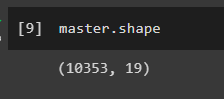

#Import Library

In [ ]:
# Import Main Library

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from scipy import stats
import scipy.stats as scp
import statsmodels.api as sm

import folium
import plotly.express as px
import plotly.io as pio
from IPython.display import display

# Master Data

In [ ]:
master = pd.read_csv("/content/AL_Train.csv")

FileNotFoundError: ignored

In [ ]:
master.head()

,ID,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price,category_age
0,MAL2617,55.702410,37.940178,UVAO,1.0,NaN,18.0,Dmitrievskaya,763.0,Underground,20323.0,One Room,9.0,NaN,40.0,panel,Good,8200000.0,Young buildings
1,MAL228,55.709341,37.764728,UVAO,1.0,1.0,15.0,Kiyevskaya,437.0,Underground,10612.0,Two Room,9.0,17.0,66.0,monolith,Excellent,14000000.0,Middle-aged buildings
2,MAL8415,55.820905,37.579699,SVAO,1.0,1.0,12.0,Vystavochny Tsentr,319.0,Underground,7829.0,One Room,3.0,9.0,32.5,block,Excellent,9100000.0,Old buildings
3,MAL3008,55.691564,37.806339,UVAO,1.0,1.0,11.0,Kashirskaya,2234.0,Underground,13469.0,Two Room,6.0,14.0,37.9,block,Poor,7600000.0,Old buildings
4,MAL1690,55.675570,37.682594,UAO,1.0,1.0,12.0,Izmaylovskaya,1201.0,Underground,8849.0,Two Room,12.0,NaN,42.0,block,Enough,10300000.0,Old buildings


In [ ]:
master.shape

(10353, 19)

In [ ]:
master.describe()

,latitude,longitude,address_offers,agent_offers,subway_offers,dist_to_subway,subway_dist_to_center,floor,max_floor,footage,price
count,8979.000000,9951.000000,9884.000000,8430.000000,7772.000000,7792.000000,9215.000000,8515.000000,9114.000000,8618.000000,1.026500e+04
mean,55.738404,37.618576,1.290065,25.044009,10.210628,928.072767,11918.266739,6.810922,13.445578,46.084252,1.088461e+07
std,0.087579,0.133899,0.729496,61.242519,7.095922,536.066525,4723.460876,5.239973,6.377801,10.478897,3.049273e+06
min,55.527631,37.306055,1.000000,0.000000,1.000000,11.000000,1133.000000,1.000000,2.000000,30.100000,4.900000e+06
25%,55.674936,37.520720,1.000000,1.000000,5.000000,543.000000,8359.000000,3.000000,9.000000,38.000000,8.500000e+06
50%,55.730593,37.604592,1.000000,1.000000,8.000000,815.000000,12418.000000,5.000000,12.000000,44.500000,1.020000e+07
75%,55.806176,37.720569,1.000000,11.000000,13.000000,1177.000000,14800.000000,9.000000,17.000000,53.200000,1.270000e+07
max,55.941577,37.950668,9.000000,292.000000,40.000000,2988.000000,24636.000000,38.000000,39.000000,89.900000,2.000000e+07


In [ ]:
master.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10353 entries, 0 to 10352
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     10353 non-null  object 
 1   latitude               8979 non-null   float64
 2   longitude              9951 non-null   float64
 3   district               9173 non-null   object 
 4   address_offers         9884 non-null   float64
 5   agent_offers           8430 non-null   float64
 6   subway_offers          7772 non-null   float64
 7   closest_subway         9319 non-null   object 
 8   dist_to_subway         7792 non-null   float64
 9   subway_grade           9556 non-null   object 
 10  subway_dist_to_center  9215 non-null   float64
 11  rooms                  8999 non-null   object 
 12  floor                  8515 non-null   float64
 13  max_floor              9114 non-null   float64
 14  footage                8618 non-null   float64
 15  ma

# Exploratory Data Analysis

Lakukan eksplorasi sederhana pada data dan ceritakan insight yang Anda dapatkan daridata
tersebut! (dapat ditambah analisis lain yang menurut kelompok Anda akan bermanfaat)

A. Apakah terdapat hubungan antara lokasi bangunan dengan harga bangunan?

B. Apa ciri-ciri bangunan yang dekat dengan subway dengan jenis kereta yang bukan
bawah tanah?

C. Apakah kondisi perbaikan bangunan yang buruk merupakan bangunan tua?

D. Apakah distrik dengan total tawaran tertinggi?

## A. Apakah terdapat hubungan antara lokasi bangunan dengan harga bangunan?

In [ ]:
apart = master.copy()

NameError: ignored

In [ ]:
apart.head()

,ID,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price,category_age
0,MAL2617,55.702410,37.940178,UVAO,1.0,NaN,18.0,Dmitrievskaya,763.0,Underground,20323.0,One Room,9.0,NaN,40.0,panel,Good,8200000.0,Young buildings
1,MAL228,55.709341,37.764728,UVAO,1.0,1.0,15.0,Kiyevskaya,437.0,Underground,10612.0,Two Room,9.0,17.0,66.0,monolith,Excellent,14000000.0,Middle-aged buildings
2,MAL8415,55.820905,37.579699,SVAO,1.0,1.0,12.0,Vystavochny Tsentr,319.0,Underground,7829.0,One Room,3.0,9.0,32.5,block,Excellent,9100000.0,Old buildings
3,MAL3008,55.691564,37.806339,UVAO,1.0,1.0,11.0,Kashirskaya,2234.0,Underground,13469.0,Two Room,6.0,14.0,37.9,block,Poor,7600000.0,Old buildings
4,MAL1690,55.675570,37.682594,UAO,1.0,1.0,12.0,Izmaylovskaya,1201.0,Underground,8849.0,Two Room,12.0,NaN,42.0,block,Enough,10300000.0,Old buildings


In [ ]:
# Filter out rows with NaN values in latitude or longitude
df_for_1a = apart.dropna(subset=['latitude', 'longitude'])

fig = px.scatter_mapbox(
    df_for_1a,
    lat='latitude',
    lon='longitude',
    color='price',
    color_continuous_scale='Viridis',  # Choose a color scale
    size_max=15,
    zoom=10,
)
pio.renderers.default = 'notebook'

# Update the layout to set the map style
fig.update_layout(mapbox_style="carto-positron")

# Show the plot
fig.show()

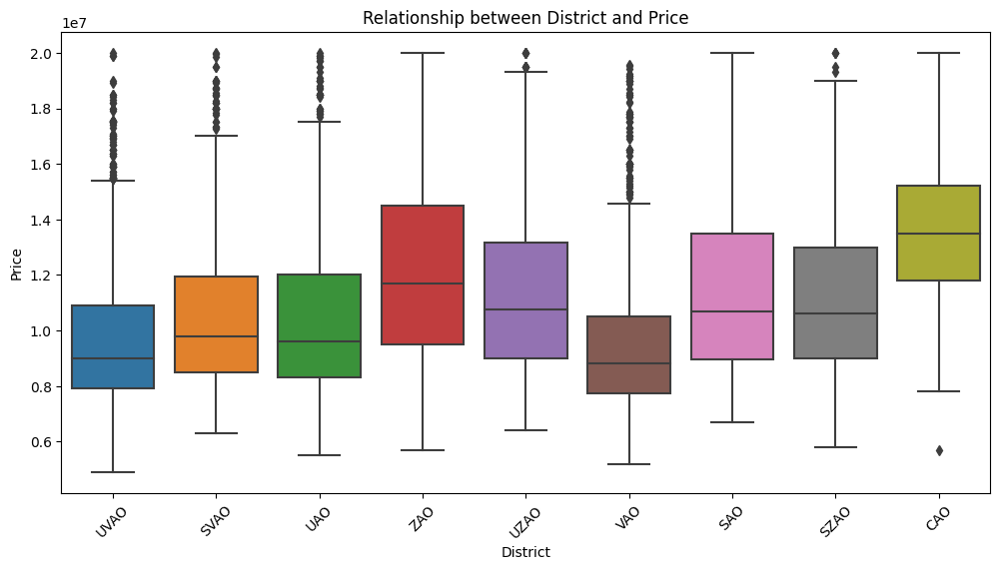

In [ ]:
# Relationship between district and price
plt.figure(figsize=(12, 6))
sns.boxplot(x='district', y='price', data=apart)
plt.title('Relationship between District and Price')
plt.xlabel('District')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.show()

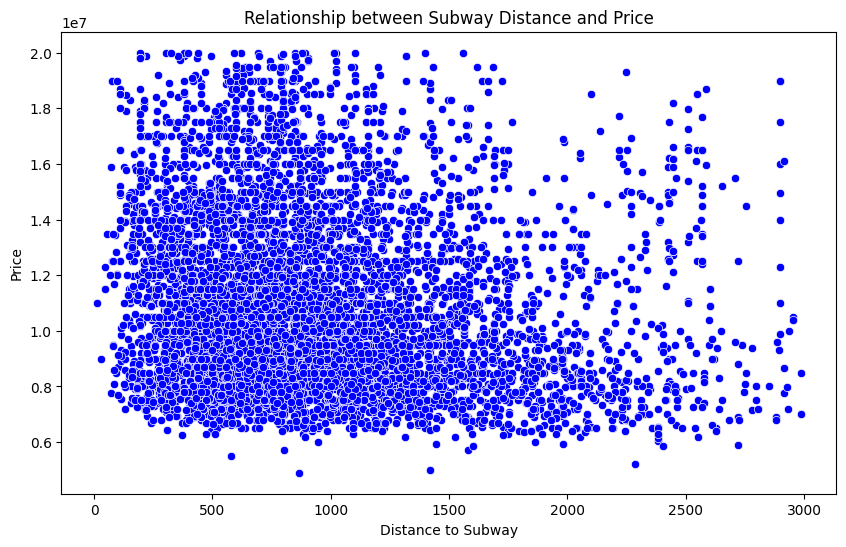

In [ ]:
# Relationship between subway distance and price
plt.figure(figsize=(10, 6))
sns.scatterplot(x='dist_to_subway', y='price', data=apart, color='blue')
plt.title('Relationship between Subway Distance and Price')
plt.xlabel('Distance to Subway')
plt.ylabel('Price')
plt.show()

##B. Apa ciri-ciri bangunan yang dekat dengan subway dengan jenis kereta yang bukan bawah tanah?

In [ ]:
apart_1b = apart[['subway_offers', 'closest_subway', 'subway_grade', 'subway_dist_to_center']]
apart_1b.head()

,subway_offers,closest_subway,subway_grade,subway_dist_to_center
0,18.0,Dmitrievskaya,Underground,20323.0
1,15.0,Kiyevskaya,Underground,10612.0
2,12.0,Vystavochny Tsentr,Underground,7829.0
3,11.0,Kashirskaya,Underground,13469.0
4,12.0,Izmaylovskaya,Underground,8849.0


In [ ]:
for col in apart_1b.select_dtypes(include=object).columns:
    print('No. of unique values in column '+col+':')
    print(apart_1b[col].value_counts(),'\n')

No. of unique values in column closest_subway:
Dmitrievskaya      261
Kuntsevskaya       191
Kiyevskaya         182
Novokuznetskaya    175
Medvedkovo         166
                  ... 
Sevastopolskaya      3
Novatorskaya         2
Kozhukhovskaya       2
Lesoparkovaya        2
Semyonovskaya        1
Name: closest_subway, Length: 177, dtype: int64 

No. of unique values in column subway_grade:
Underground      8186
Suburban rail     848
Urban rail        467
Monorail           55
Name: subway_grade, dtype: int64 



In [ ]:
# Membuat dataset pertama dengan subway_grade berisi 'Underground'
underground = apart[apart['subway_grade'] == 'Underground'].copy()
underground.shape

(8186, 19)

In [ ]:
# Membuat dataset kedua dengan subway_grade tidak berisi 'Underground'
not_underground = apart[apart['subway_grade'] != 'Underground'].copy()
not_underground.shape

(2167, 19)

In [ ]:
# Mencari nilai unik di setiap kolom kategorikal
list_kolom_kategori = []
for col in underground.select_dtypes(include=object).columns:
    print('No. of unique values in column '+col+':')
    print(underground[col].value_counts(),'\n')
    list_kolom_kategori+=[col]

print(list_kolom_kategori)

No. of unique values in column ID:
MAL2617    1
MAL9230    1
MAL8677    1
MAL8177    1
MAL4520    1
          ..
MAL6249    1
MAL3665    1
MAL1873    1
MAL5655    1
MAL4476    1
Name: ID, Length: 8186, dtype: int64 

No. of unique values in column district:
UVAO    1291
ZAO      958
UZAO     933
VAO      879
UAO      817
SVAO     760
SAO      736
CAO      458
SZAO     416
Name: district, dtype: int64 

No. of unique values in column closest_subway:
Dmitrievskaya      242
Kiyevskaya         166
Novokuznetskaya    161
Medvedkovo         154
Mnyovniki          144
                  ... 
Novatorskaya         2
Kozhukhovskaya       2
Sevastopolskaya      2
Semyonovskaya        1
Lesoparkovaya        1
Name: closest_subway, Length: 150, dtype: int64 

No. of unique values in column subway_grade:
Underground    8186
Name: subway_grade, dtype: int64 

No. of unique values in column rooms:
Two Room    4266
One Room    2845
Name: rooms, dtype: int64 

No. of unique values in column material:
pan

In [ ]:
# Remove kolom yang tidak dibutuhkan
list_kolom_kategori.remove('ID')
list_kolom_kategori.remove('subway_grade')
list_kolom_kategori

['district', 'closest_subway', 'rooms', 'material', 'repair', 'category_age']

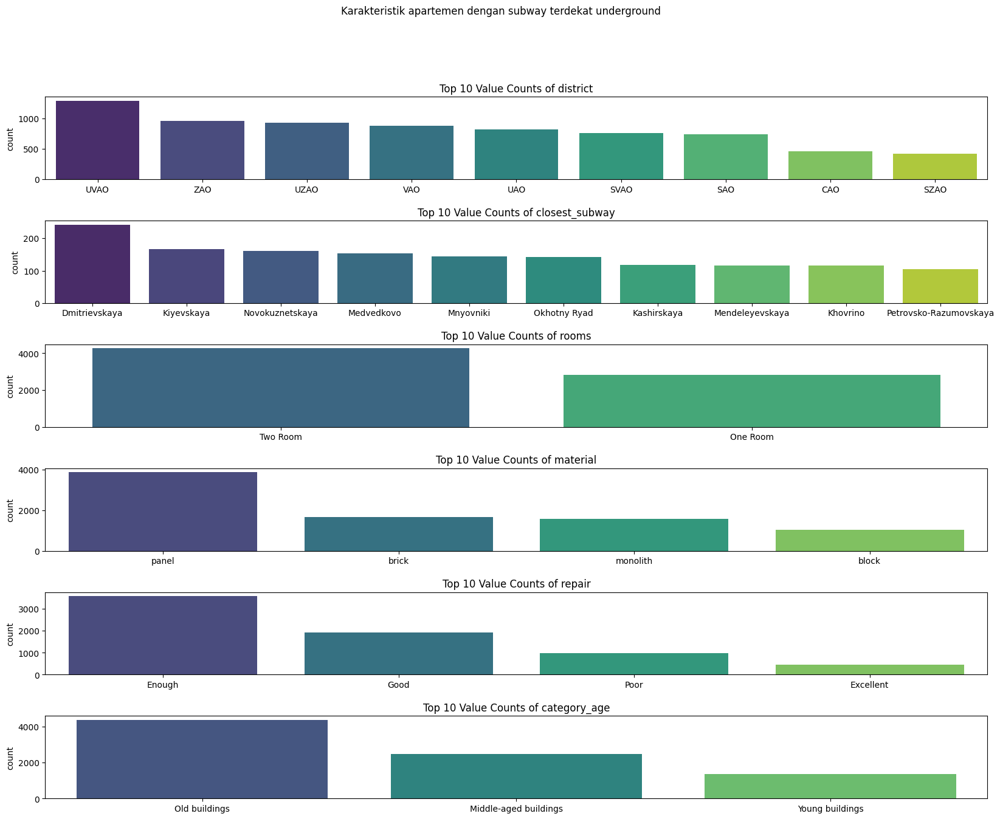

In [ ]:
# Membuat subplot dengan ukuran sesuai dengan jumlah kolom
fig, axes = plt.subplots(nrows=len(list_kolom_kategori), ncols=1, figsize=(20, 15))

# Loop untuk membuat bar chart untuk setiap kolom

for i, kolom in enumerate(list_kolom_kategori):
    value_counts_top10 = underground[kolom].value_counts().nlargest(10).sort_values(ascending=False)
    sns.countplot(x=kolom, data=underground, ax=axes[i], order=value_counts_top10.index, palette='viridis')
    axes[i].set_title(f'Top 10 Value Counts of {kolom}')
    axes[i].set_xlabel('')  # Menghilangkan label sumbu x untuk memberikan ruang lebih pada label di sebelah kiri

# Menyesuaikan layout dan menampilkan plot
plt.subplots_adjust(hspace=0.5)  # Menambahkan ruang antar subplot
plt.suptitle("Karakteristik apartemen dengan subway terdekat underground")
plt.show()

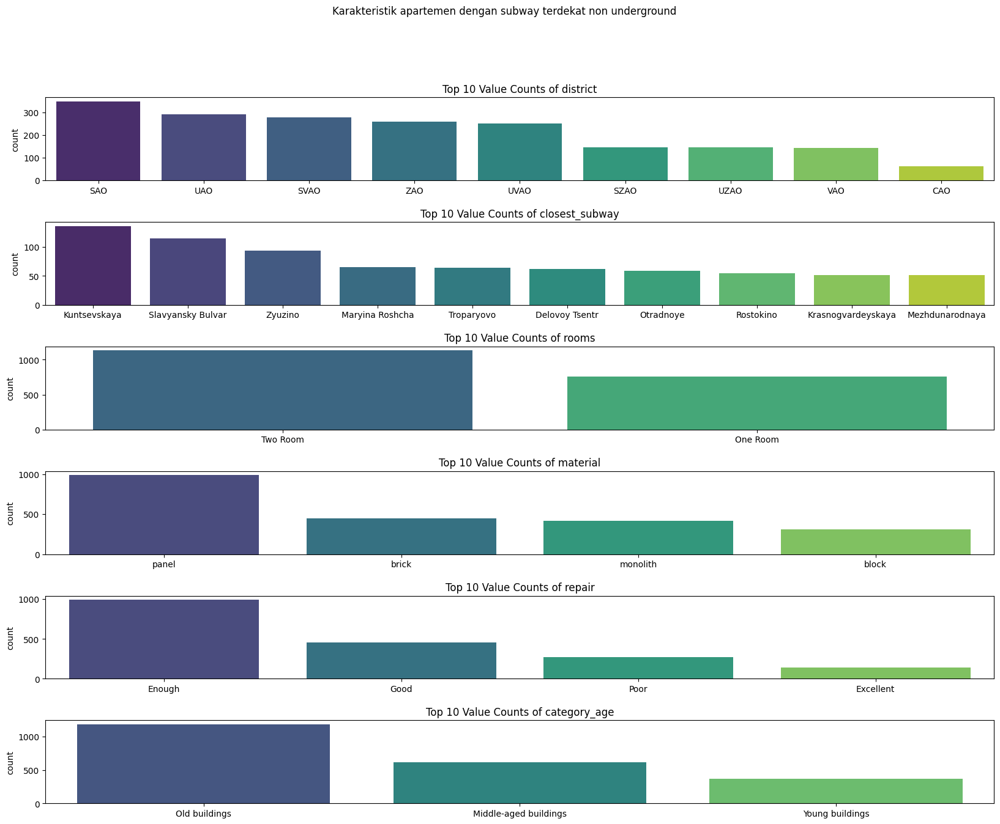

In [ ]:
# Membuat subplot dengan ukuran sesuai dengan jumlah kolom
fig, axes = plt.subplots(nrows=len(list_kolom_kategori), ncols=1, figsize=(20, 15))

# Loop untuk membuat bar chart untuk setiap kolom
for i, kolom in enumerate(list_kolom_kategori):
    value_counts_top10 = not_underground[kolom].value_counts().nlargest(10).sort_values(ascending=False)
    sns.countplot(x=kolom, data=not_underground, ax=axes[i], order=value_counts_top10.index, palette='viridis')
    axes[i].set_title(f'Top 10 Value Counts of {kolom}')
    axes[i].set_xlabel('')  # Menghilangkan label sumbu x untuk memberikan ruang lebih pada label di sebelah kiri

# Menyesuaikan layout dan menampilkan plot
plt.subplots_adjust(hspace=0.5)  # Menambahkan ruang antar subplot
plt.suptitle("Karakteristik apartemen dengan subway terdekat non underground")
plt.show()

Ciri-ciri : dekat dengan stasiun kuntsevskaya, sylvansky bulvar, zyuzino, maryina roshcha, troparyovo, delovoy tsentr, otradnoye dst

In [ ]:
apart_for_1b = apart.copy()

apart_for_1b.dropna(subset=['subway_grade'], inplace=True)

# Membuat kolom baru group_udg
apart_for_1b['group_udg'] = apart_for_1b['subway_grade'].apply(lambda x: 'underground' if x.lower() == 'underground' else 'not_underground')
apart_for_1b

,ID,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price,category_age,group_udg
0,MAL2617,55.702410,37.940178,UVAO,1.0,NaN,18.0,Dmitrievskaya,763.0,Underground,20323.0,One Room,9.0,NaN,40.0,panel,Good,8200000.0,Young buildings,underground
1,MAL228,55.709341,37.764728,UVAO,1.0,1.0,15.0,Kiyevskaya,437.0,Underground,10612.0,Two Room,9.0,17.0,66.0,monolith,Excellent,14000000.0,Middle-aged buildings,underground
2,MAL8415,55.820905,37.579699,SVAO,1.0,1.0,12.0,Vystavochny Tsentr,319.0,Underground,7829.0,One Room,3.0,9.0,32.5,block,Excellent,9100000.0,Old buildings,underground
3,MAL3008,55.691564,37.806339,UVAO,1.0,1.0,11.0,Kashirskaya,2234.0,Underground,13469.0,Two Room,6.0,14.0,37.9,block,Poor,7600000.0,Old buildings,underground
4,MAL1690,55.675570,37.682594,UAO,1.0,1.0,12.0,Izmaylovskaya,1201.0,Underground,8849.0,Two Room,12.0,NaN,42.0,block,Enough,10300000.0,Old buildings,underground
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10345,MAL9204,55.700613,37.633634,UAO,1.0,1.0,10.0,Kuntsevskaya,955.0,Urban rail,6335.0,NaN,12.0,14.0,NaN,monolith,Poor,16000000.0,Young buildings,not_underground
10346,MAL7789,55.720673,37.417645,ZAO,1.0,1.0,10.0,Zyuzino,694.0,Suburban rail,12693.0,Two Room,17.0,17.0,60.2,panel,Enough,13000000.0,Middle-aged buildings,not_underground
10349,MAL11837,55.633076,37.610935,UAO,1.0,NaN,NaN,ZIL,NaN,Underground,12436.0,Two Room,10.0,18.0,58.6,panel,NaN,14300000.0,Middle-aged buildings,underground
10350,MAL11260,55.723364,37.607906,CAO,1.0,11.0,4.0,Verkhnie Kotly,504.0,Underground,3744.0,Two Room,8.0,9.0,38.0,panel,NaN,11500000.0,Old buildings,underground


In [ ]:
null_count_in_column = apart['subway_grade'].isnull().sum()

print(f"Null count in '{'subway_grade'}': {null_count_in_column}")

Null count in 'subway_grade': 797


In [ ]:

# Create scatter map box for both underground and not_underground subway_grade
fig_combined = px.scatter_mapbox(
    apart_for_1b,
    lat='latitude',
    lon='longitude',
    color='subway_grade',
    color_discrete_sequence=['blue', 'red'],  # Choose colors for underground and not_underground
    size_max=15,
    zoom=10,
    title='Persebaran Apartemen dengan Subway Grade: Underground dan Not Underground'
)
fig_combined.update_layout(mapbox_style="carto-positron")

# Show the combined plot
fig_combined.show()


Ciri - ciri : relatif jauh dari pusat kota moskow. Dan tersebar pada grafik di atas berwarna merah

## C. Apakah kondisi perbaikan bangunan yang buruk merupakan bangunan tua?

In [ ]:
repair_distribution = apart['repair'].value_counts()
age_distribution = apart['category_age'].value_counts()
print(repair_distribution)
print(age_distribution)

Enough       4578
Good         2384
Poor         1239
Excellent     604
Name: repair, dtype: int64
Old buildings            5547
Middle-aged buildings    3077
Young buildings          1729
Name: category_age, dtype: int64


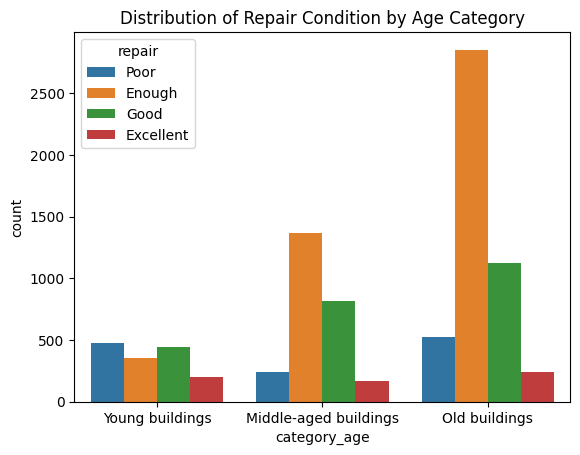

In [ ]:
order = ["Poor", "Enough", "Good", "Excellent"]
apart['repair'] = pd.Categorical(apart['repair'], categories=order, ordered=True)

sns.countplot(x='category_age', hue='repair', data=apart)
plt.title('Distribution of Repair Condition by Age Category')
plt.show()

In [ ]:
from scipy.stats import chi2_contingency
from scipy.stats import chi2

cross_table = pd.crosstab(apart['category_age'], apart['repair'])
stat, p, dof, expected = stats.chi2_contingency(cross_table)

prob = 0.95
# interpret p-value
alpha = 1.0 - prob
print('p=%.10f'%p)
print('alpha=',alpha)
if ((p) <= (alpha)):
	print('Dependent (reject H0)')
else:
	print('Independent (fail to reject H0)')
print("\n\n\n")
print('dof=%d' % dof)
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
	print('Dependent (reject H0)')
else:
	print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
	print('Dependent (reject H0)')
else:
	print('Independent (fail to reject H0)')

p=0.0000000000
alpha= 0.050000000000000044
Dependent (reject H0)




dof=6
probability=0.950, critical=12.592, stat=851.904
Dependent (reject H0)
significance=0.050, p=0.000
Dependent (reject H0)


In [ ]:
cross_table

repair,Poor,Enough,Good,Excellent
category_age,,,,
Middle-aged buildings,238,1368,818,164
Old buildings,528,2853,1122,243
Young buildings,473,357,444,197


## D. Apakah distrik dengan total tawaran tertinggi?

In [ ]:
# Group by district and sum the total offers
district_offers = apart.groupby('district')['address_offers'].sum().reset_index()

# Sort the data by total offers in descending order
district_offers = district_offers.sort_values(by='address_offers', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='district', y='address_offers', data=district_offers.head())
plt.title('Top Districts with Highest Total Offers')
plt.xlabel('District')
plt.ylabel('Total Offers')
plt.show()

NameError: ignored

In [ ]:
# Display the map in the notebook
# mymap = folium.Map(location=[apart['latitude'].mean(), apart['longitude'].mean()], zoom_start=12)
mymap = folium.Map(
    location=[apart['latitude'].mean(), apart['longitude'].mean()],
    zoom_start=12,
)

# Add markers for each district with the total offers as the popup
for index, row in district_offers.iterrows():
    folium.Marker(
        location=[apart[apart['district'] == row['district']]['latitude'].mean(),
                  apart[apart['district'] == row['district']]['longitude'].mean()],
        popup=f"District: {row['district']}\nTotal Offers: {row['address_offers']}"
    ).add_to(mymap)

# Display the map in the notebook
mymap

In [ ]:
fig = px.scatter_mapbox(
    df_for_1a,
    lat='latitude',
    lon='longitude',
    color='agent_offers',
    color_continuous_scale='Viridis',  # Choose a color scale
    size_max=15,
    zoom=10,
)
pio.renderers.default = 'notebook'

# Update the layout to set the map style
fig.update_layout(mapbox_style="carto-positron")

# Show the plot
fig.show()

## E. Apakah lantai tempat apartemen berada dapat mempengaruhi harga?


In [ ]:
# Membaca dataset
df = master.copy()

# Menghapus baris dengan nilai null
df = df.dropna()

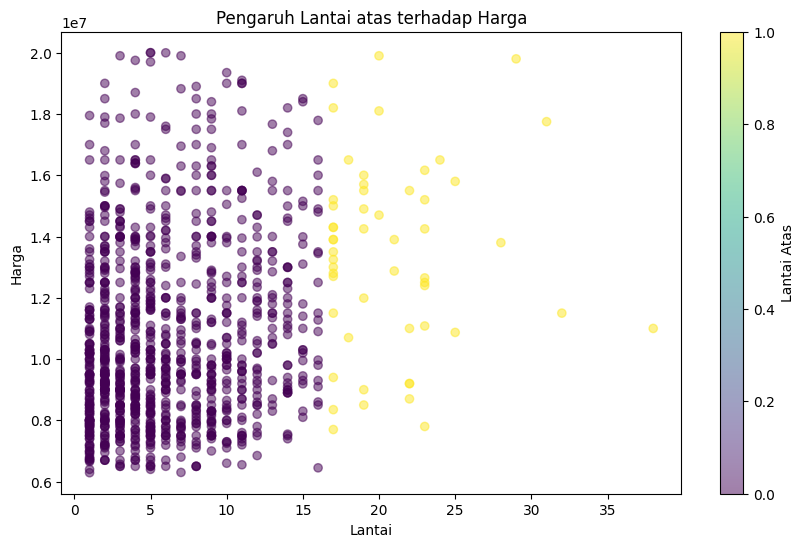

Rata-rata harga untuk lantai atas: 13418428.547169812
Rata-rata harga untuk bukan lantai atas: 10706023.965648854


In [ ]:
# Menghitung lantai atas berdasarkan persentase
percentile_floor = 0.75
max_floor_threshold = df['max_floor'].quantile(percentile_floor)

# Membuat kolom baru untuk menandai apakah suatu apartemen berada di lantai atas atau tidak
df['is_top_floor'] = df['floor'] >= max_floor_threshold

# Memvisualisasikan pengaruh lantai atas terhadap harga
plt.figure(figsize=(10, 6))
plt.scatter(df['floor'], df['price'], c=df['is_top_floor'], cmap='viridis', alpha=0.5)
plt.xlabel('Lantai')
plt.ylabel('Harga')
plt.title('Pengaruh Lantai atas terhadap Harga')
plt.colorbar(label='Lantai Atas')
plt.show()

# Menghitung statistik rata-rata harga untuk lantai atas dan bukan lantai atas
average_price_top_floor = df[df['is_top_floor']]['price'].mean()
average_price_not_top_floor = df[~df['is_top_floor']]['price'].mean()

print(f"Rata-rata harga untuk lantai atas: {average_price_top_floor}")
print(f"Rata-rata harga untuk bukan lantai atas: {average_price_not_top_floor}")

## F. Apartemen yang terletak dekat stasiun subway mana yang mempunyai rata-rata harga sewa tertinggi?

<Figure size 1200x800 with 0 Axes>

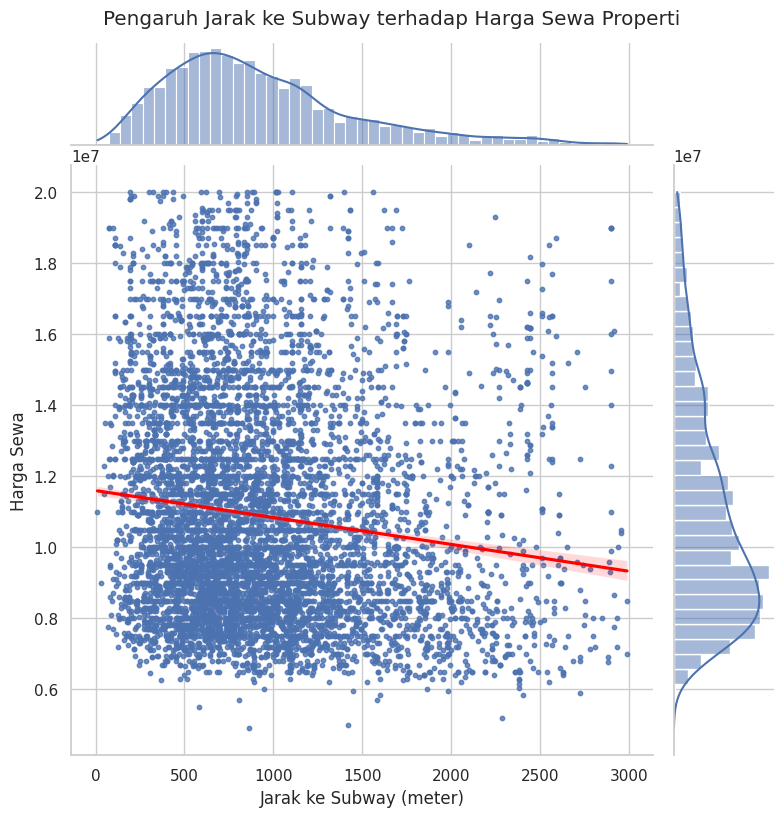

In [ ]:
subway_data = apart[apart['dist_to_subway'].notnull()]

# Menyusun data visualisasi dengan jointplot
plt.figure(figsize=(12, 8))
sns.set_theme(style="whitegrid")
sns.jointplot(x='dist_to_subway', y='price', data=subway_data, kind='reg', height=8, scatter_kws={'s': 10}, line_kws={'color': 'red'})
plt.suptitle('Pengaruh Jarak ke Subway terhadap Harga Sewa Properti', y=1.02)
plt.xlabel('Jarak ke Subway (meter)')
plt.ylabel('Harga Sewa')
plt.show()

In [ ]:
correlation = subway_data['dist_to_subway'].corr(subway_data['price'])
print(f'Korelasi antara Jarak ke Subway dan Harga Sewa: {correlation}')

Korelasi antara Jarak ke Subway dan Harga Sewa: -0.13227623533376967


In [ ]:
apart.corr(method='pearson')

<ipython-input-38-8cd090cf71e8>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,latitude,longitude,address_offers,agent_offers,subway_offers,dist_to_subway,subway_dist_to_center,floor,max_floor,footage,price
latitude,1.000000,-0.107261,-0.002567,-0.012469,0.047634,0.067767,-0.238739,-0.010017,-0.042305,-0.028513,0.043528
longitude,-0.107261,1.000000,-0.031133,0.009150,0.370647,0.026579,0.002333,-0.035684,-0.076813,-0.038495,-0.266584
address_offers,-0.002567,-0.031133,1.000000,0.007591,0.090967,-0.043263,-0.004580,0.175201,0.249149,0.138103,0.171699
agent_offers,-0.012469,0.009150,0.007591,1.000000,0.018392,-0.017974,0.022031,0.008856,-0.001765,-0.013701,0.012970
subway_offers,0.047634,0.370647,0.090967,0.018392,1.000000,0.174482,0.234705,0.077123,0.081656,0.019413,-0.176249
dist_to_subway,0.067767,0.026579,-0.043263,-0.017974,0.174482,1.000000,0.126841,0.035801,0.049177,0.011514,-0.132276
subway_dist_to_center,-0.238739,0.002333,-0.004580,0.022031,0.234705,0.126841,1.000000,0.136966,0.207368,0.057769,-0.367162
floor,-0.010017,-0.035684,0.175201,0.008856,0.077123,0.035801,0.136966,1.000000,0.564797,0.185582,0.228781
max_floor,-0.042305,-0.076813,0.249149,-0.001765,0.081656,0.049177,0.207368,0.564797,1.000000,0.300376,0.345419
footage,-0.028513,-0.038495,0.138103,-0.013701,0.019413,0.011514,0.057769,0.185582,0.300376,1.000000,0.688578


Text(0.5, 1.0, 'Correlation matrix')

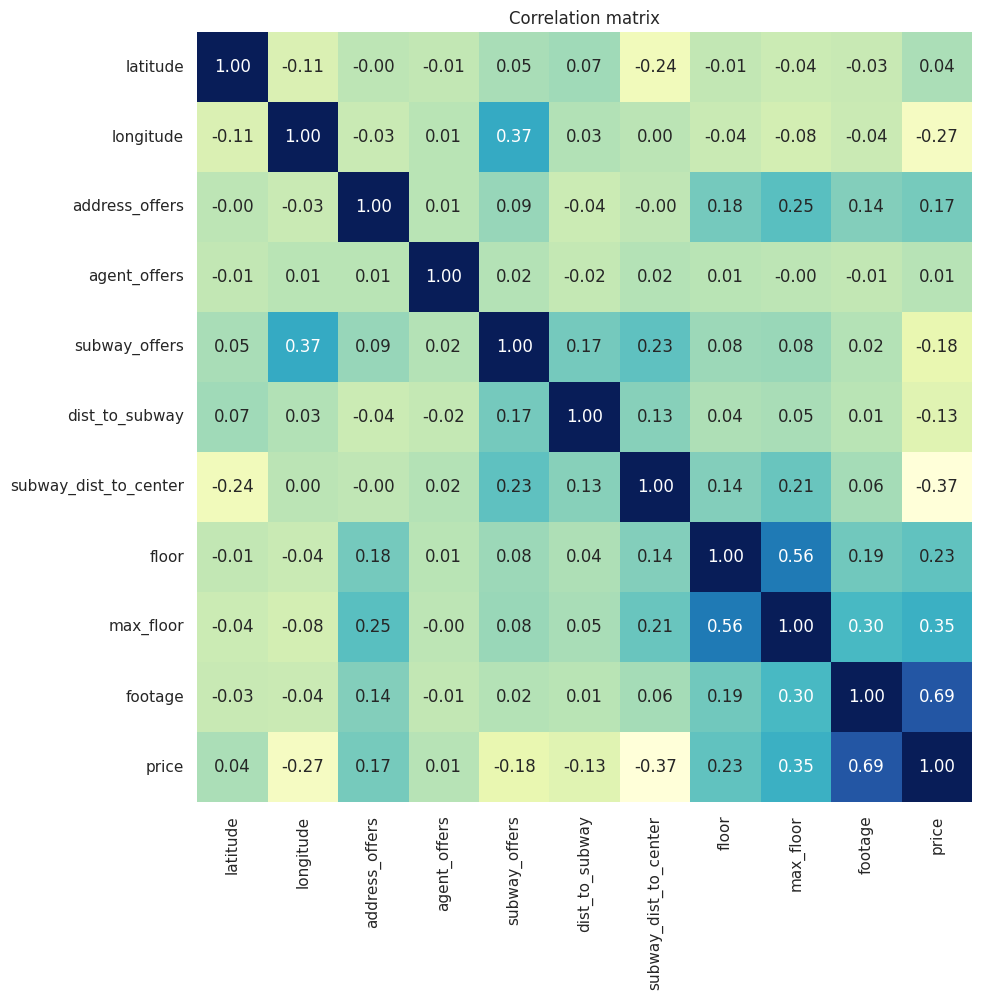

In [ ]:
# Visualisasi matriks korelasi dengan heatmap
plt.figure(figsize=(10,10))

sns.heatmap(apart.select_dtypes(np.number).corr(),
        annot=True,
        cbar=False,
        fmt="0.2f",
        cmap="YlGnBu",
        xticklabels=apart.select_dtypes(np.number).columns,
        yticklabels=apart.select_dtypes(np.number).columns)
plt.title("Correlation matrix")

<Axes: xlabel='dist_to_subway', ylabel='price'>

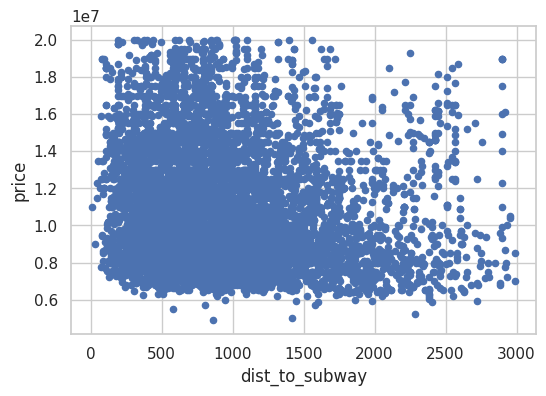

In [ ]:
# Membuat scatterplot untuk value_euro terhadap overall_rating
apart.plot.scatter(x="dist_to_subway", y="price", figsize=(6,4))

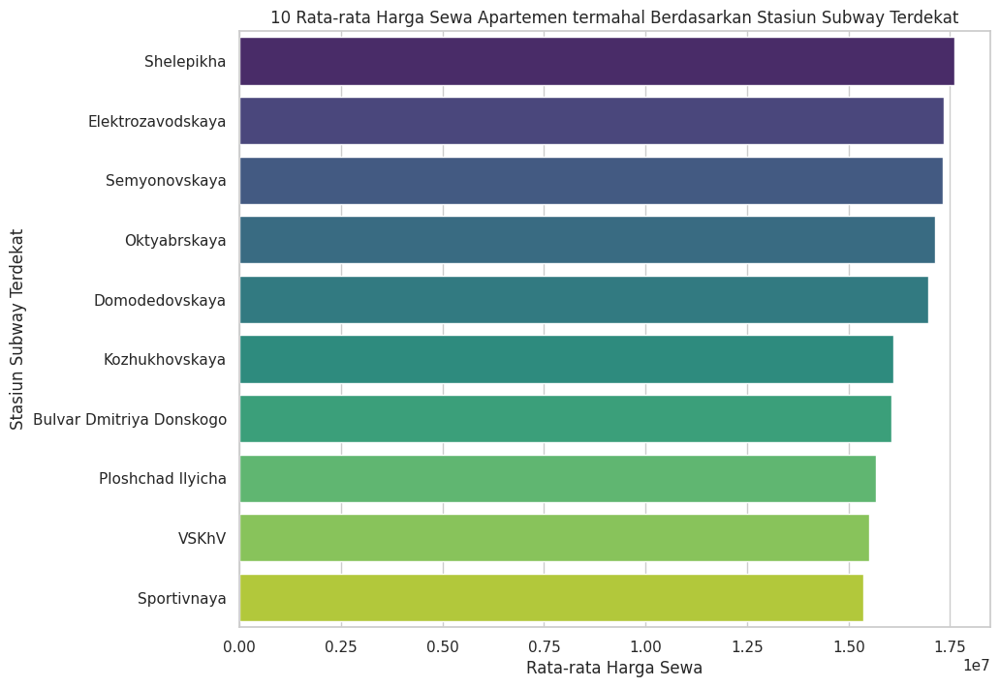

In [ ]:
filtered_data = apart.dropna(subset=['price', 'closest_subway'])

# Menghitung rata-rata harga sewa berdasarkan stasiun subway terdekat
average_price_by_subway = filtered_data.groupby('closest_subway')['price'].mean().reset_index()

# Mengurutkan data berdasarkan rata-rata harga sewa secara descending
sorted_data = average_price_by_subway.sort_values(by='price', ascending=False)

top10_subways = sorted_data.head(10)

# Visualisasi
plt.figure(figsize=(10, 8))
sns.barplot(x='price', y='closest_subway', data=top10_subways, palette='viridis')
plt.title('10 Rata-rata Harga Sewa Apartemen termahal Berdasarkan Stasiun Subway Terdekat')
plt.xlabel('Rata-rata Harga Sewa')
plt.ylabel('Stasiun Subway Terdekat')
plt.show()

# Modelling

### Main Data Preparation

In [ ]:
# More import library
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer # jika tidak bisa, jalankan command "pip install yellowbrick"
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA

#### **Read Data**

In [ ]:
data = master.copy()

In [ ]:
data.head(3)

,ID,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price,category_age
0,MAL2617,55.702410,37.940178,UVAO,1.0,NaN,18.0,Dmitrievskaya,763.0,Underground,20323.0,One Room,9.0,NaN,40.0,panel,Good,8200000.0,Young buildings
1,MAL228,55.709341,37.764728,UVAO,1.0,1.0,15.0,Kiyevskaya,437.0,Underground,10612.0,Two Room,9.0,17.0,66.0,monolith,Excellent,14000000.0,Middle-aged buildings
2,MAL8415,55.820905,37.579699,SVAO,1.0,1.0,12.0,Vystavochny Tsentr,319.0,Underground,7829.0,One Room,3.0,9.0,32.5,block,Excellent,9100000.0,Old buildings


In [ ]:
print("Jumlah baris:", data.shape[0])
print("Jumlah kolom:", data.shape[1])

Jumlah baris: 10353
Jumlah kolom: 19


#### Handle Inconsistent

In [ ]:
for col in data.select_dtypes(include=object).columns:
    print('No. of unique values in column '+col+':')
    print(data[col].value_counts(),'\n')

#### **Handle Duplicates**

In [ ]:
print("Jumlah duplikasi data : " + str(data.duplicated().sum()))

Jumlah duplikasi data : 0


Terlihat bahwa dataset ini tidak mempunyai baris duplikat, sehingga tidak perlu dilakukan penanganan.

#### **Handle Missing Values**

In [ ]:
# Mendefinisikan fungsi cek nilai null
def check_null(df):
    col_na = df.isnull().sum().sort_values(ascending=True)
    percent = col_na *100 / len(df)
    missing_data = pd.concat([col_na, percent], axis=1, keys=['Total', 'Percent'])

    if (missing_data[missing_data['Total'] > 0].shape[0] == 0):
        print("Tidak ditemukan missing value pada dataset")
    else:
        print(missing_data[missing_data['Total'] > 0])

In [ ]:
# Mengecek nilai null
check_null(data)

                       Total    Percent
material                  43   0.415339
price                     88   0.849995
longitude                402   3.882932
address_offers           469   4.530088
subway_grade             797   7.698252
closest_subway          1034   9.987443
subway_dist_to_center   1138  10.991983
district                1180  11.397663
max_floor               1239  11.967546
rooms                   1354  13.078335
latitude                1374  13.271516
repair                  1548  14.952188
footage                 1735  16.758428
floor                   1838  17.753308
agent_offers            1923  18.574326
dist_to_subway          2561  24.736791
subway_offers           2581  24.929972


Terlihat bahwa dataset ini mempunyai banyak missing values (null), sehingga perlu dilakukan penanganan.

Akan dilakukan imputasi yang sesuai untuk menggantikan nilai null tersebut yakni mean atau median untuk atribut numerik (sesuai dengan distribusi data) dan modus untuk atribut kategorikal.

In [ ]:
# Check Skewness untuk Semua Atribut Numerik
data.select_dtypes(include=["int64", "float64"]).skew().sort_values(ascending=False)

address_offers           3.800672
agent_offers             3.060087
subway_offers            1.569582
floor                    1.358119
dist_to_subway           1.081970
max_floor                0.883808
price                    0.827796
footage                  0.750655
longitude                0.225679
subway_dist_to_center    0.207851
latitude                 0.003885
dtype: float64

Interpretasi nilai skewness ([referensi](https://pythontic.com/pandas/dataframe-computations/skew#:~:text=When%20a%20distribution%20is%20asymmetrical,hand%20side%20of%20the%20curve)):

* Jika nilainya positif maka right skewed (buntut kanan > buntut kiri)
* Jika nilainya negatif maka left skewed (buntut kiri > buntut kanan)
* Jika skewness = 0, data simetris

Berdasarkan literatur [berikut](https://jse.amstat.org/v19n2/doane.pdf), nilai skewness 0.4 hingga -0.4 merupakan *reasonable cutoffs* (batas wajar) untuk sampel besar, sehingga data yang berada di rentang ini skewnessnya akan dianggap 0 (terdistribusi normal)

Oleh karena itu, ```longitude, subway_dist_to_center, latitude``` dapat dianggap berdistribusi normal, sedangkan ```address_offers, agent_offers, subway_offers, floor, dist_to_subway, max_floor, price, footage``` memiliki karakteristik left skewed.

imputasi nilai null akan menggunakan mean untuk data terdistribusi normal, median untuk data skewed, dan modus untuk data kategorikal.

In [ ]:
# Imputasi data null

numerical_normal = ['longitude', 'subway_dist_to_center', 'latitude']
data[numerical_normal] = data[numerical_normal].fillna(data[numerical_normal].mean())

numerical_skewed = ['address_offers', 'agent_offers', 'subway_offers', 'floor', 'dist_to_subway', 'max_floor', 'price', 'footage']
data[numerical_skewed] = data[numerical_skewed].fillna(data[numerical_skewed].median())

categorical = ['district', 'closest_subway', 'subway_grade', 'rooms', 'material', 'repair', 'ID', 'category_age']
data[categorical] = data[categorical].apply(lambda x: x.fillna(x.mode()[0]))

In [ ]:
# Recheck null values
check_null(data)

Tidak ditemukan missing value pada dataset


## A. Classification

Buatlah model untuk mengklasifikasi kategori usia bangunan dari apartemen

#### Preprocessing for classification

In [ ]:
data_cf = data.copy()

In [ ]:
numerical_columns = data_cf.select_dtypes(include=['float64', 'int64']).columns
print("Kolom berisi numerik:")
numerical_columns

Kolom berisi numerik:


Index(['latitude', 'longitude', 'address_offers', 'agent_offers',
       'subway_offers', 'dist_to_subway', 'subway_dist_to_center', 'floor',
       'max_floor', 'footage', 'price'],
      dtype='object')

In [ ]:
categorical_columns = data_cf.select_dtypes(include=['object']).columns
print("Kolom berisi kategori:")
categorical_columns

Kolom berisi kategori:


Index(['ID', 'district', 'closest_subway', 'subway_grade', 'rooms', 'material',
       'repair', 'category_age'],
      dtype='object')

Melakukan encoding ke data tipe kategori

In [ ]:
# Encoding Atribut Kategorikal
from sklearn import preprocessing

# Label Encoder
le = preprocessing.LabelEncoder()
data_cf['closest_subway'] = le.fit_transform(data_cf['closest_subway'])
data_cf['category_age'] = le.fit_transform(data_cf['category_age'])

# One Hot Encoder
ohe = preprocessing.OneHotEncoder()

columns_to_encode = ['district', 'subway_grade', 'rooms', 'material', 'repair']
data_cf = pd.get_dummies(data_cf, columns=columns_to_encode)

data_cf

,ID,latitude,longitude,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_dist_to_center,floor,...,rooms_One Room,rooms_Two Room,material_block,material_brick,material_monolith,material_panel,repair_Enough,repair_Excellent,repair_Good,repair_Poor
0,MAL2617,55.702410,37.940178,1.0,1.0,18.0,35,763.0,20323.0,9.0,...,1,0,0,0,0,1,0,0,1,0
1,MAL228,55.709341,37.764728,1.0,1.0,15.0,54,437.0,10612.0,9.0,...,0,1,0,0,1,0,0,1,0,0
2,MAL8415,55.820905,37.579699,1.0,1.0,12.0,172,319.0,7829.0,3.0,...,1,0,1,0,0,0,0,1,0,0
3,MAL3008,55.691564,37.806339,1.0,1.0,11.0,51,2234.0,13469.0,6.0,...,0,1,1,0,0,0,0,0,0,1
4,MAL1690,55.675570,37.682594,1.0,1.0,12.0,47,1201.0,8849.0,12.0,...,0,1,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10348,MAL8945,55.638211,37.363726,1.0,1.0,7.0,110,586.0,20688.0,11.0,...,0,1,0,0,0,1,1,0,0,0
10349,MAL11837,55.633076,37.610935,1.0,1.0,8.0,175,815.0,12436.0,10.0,...,0,1,0,0,0,1,1,0,0,0
10350,MAL11260,55.723364,37.607906,1.0,11.0,4.0,163,504.0,3744.0,8.0,...,0,1,0,0,0,1,1,0,0,0
10351,MAL4476,55.738404,37.753964,1.0,2.0,16.0,160,815.0,9000.0,16.0,...,1,0,0,0,1,0,0,0,1,0


In [ ]:
# from sklearn.preprocessing import LabelEncoder

# le = LabelEncoder()
# for col in categorical_columns:
#       data_cf[col] = le.fit_transform(data_cf[col])

Tipe data pada tiap kolom menjadi integer ataupun float

In [ ]:
data_cf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10353 entries, 0 to 10352
Data columns (total 37 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          10353 non-null  object 
 1   latitude                    10353 non-null  float64
 2   longitude                   10353 non-null  float64
 3   address_offers              10353 non-null  float64
 4   agent_offers                10353 non-null  float64
 5   subway_offers               10353 non-null  float64
 6   closest_subway              10353 non-null  int64  
 7   dist_to_subway              10353 non-null  float64
 8   subway_dist_to_center       10353 non-null  float64
 9   floor                       10353 non-null  float64
 10  max_floor                   10353 non-null  float64
 11  footage                     10353 non-null  float64
 12  price                       10353 non-null  float64
 13  category_age                103

Menghapus data yang tidak diperlukan

In [ ]:
data_cf

,ID,latitude,longitude,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_dist_to_center,floor,...,rooms_One Room,rooms_Two Room,material_block,material_brick,material_monolith,material_panel,repair_Enough,repair_Excellent,repair_Good,repair_Poor
0,MAL2617,55.702410,37.940178,1.0,1.0,18.0,35,763.0,20323.0,9.0,...,1,0,0,0,0,1,0,0,1,0
1,MAL228,55.709341,37.764728,1.0,1.0,15.0,54,437.0,10612.0,9.0,...,0,1,0,0,1,0,0,1,0,0
2,MAL8415,55.820905,37.579699,1.0,1.0,12.0,172,319.0,7829.0,3.0,...,1,0,1,0,0,0,0,1,0,0
3,MAL3008,55.691564,37.806339,1.0,1.0,11.0,51,2234.0,13469.0,6.0,...,0,1,1,0,0,0,0,0,0,1
4,MAL1690,55.675570,37.682594,1.0,1.0,12.0,47,1201.0,8849.0,12.0,...,0,1,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10348,MAL8945,55.638211,37.363726,1.0,1.0,7.0,110,586.0,20688.0,11.0,...,0,1,0,0,0,1,1,0,0,0
10349,MAL11837,55.633076,37.610935,1.0,1.0,8.0,175,815.0,12436.0,10.0,...,0,1,0,0,0,1,1,0,0,0
10350,MAL11260,55.723364,37.607906,1.0,11.0,4.0,163,504.0,3744.0,8.0,...,0,1,0,0,0,1,1,0,0,0
10351,MAL4476,55.738404,37.753964,1.0,2.0,16.0,160,815.0,9000.0,16.0,...,1,0,0,0,1,0,0,0,1,0


In [ ]:
data_cf.drop(['ID'], axis=1, inplace=True)

In [ ]:
data_cf

,latitude,longitude,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_dist_to_center,floor,max_floor,...,rooms_One Room,rooms_Two Room,material_block,material_brick,material_monolith,material_panel,repair_Enough,repair_Excellent,repair_Good,repair_Poor
0,55.702410,37.940178,1.0,1.0,18.0,35,763.0,20323.0,9.0,12.0,...,1,0,0,0,0,1,0,0,1,0
1,55.709341,37.764728,1.0,1.0,15.0,54,437.0,10612.0,9.0,17.0,...,0,1,0,0,1,0,0,1,0,0
2,55.820905,37.579699,1.0,1.0,12.0,172,319.0,7829.0,3.0,9.0,...,1,0,1,0,0,0,0,1,0,0
3,55.691564,37.806339,1.0,1.0,11.0,51,2234.0,13469.0,6.0,14.0,...,0,1,1,0,0,0,0,0,0,1
4,55.675570,37.682594,1.0,1.0,12.0,47,1201.0,8849.0,12.0,12.0,...,0,1,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10348,55.638211,37.363726,1.0,1.0,7.0,110,586.0,20688.0,11.0,12.0,...,0,1,0,0,0,1,1,0,0,0
10349,55.633076,37.610935,1.0,1.0,8.0,175,815.0,12436.0,10.0,18.0,...,0,1,0,0,0,1,1,0,0,0
10350,55.723364,37.607906,1.0,11.0,4.0,163,504.0,3744.0,8.0,9.0,...,0,1,0,0,0,1,1,0,0,0
10351,55.738404,37.753964,1.0,2.0,16.0,160,815.0,9000.0,16.0,23.0,...,1,0,0,0,1,0,0,0,1,0


Menghapus fitur yang sangat berkorelasi

In [ ]:
correlation_matrix = data_cf.corr().abs()
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(np.bool))
high_correlation_cols = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.8)]  # Misal korelasi > 0.8
data_cf.drop(high_correlation_cols, axis=1, inplace=True)

<ipython-input-60-41d8d7dd1ec4>:2: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [ ]:
print("Jumlah kolom:", data_cf.shape[1])

Jumlah kolom: 35


Membagi data train dan test

In [ ]:
X = data_cf.drop('category_age', axis=1)
y = data_cf['category_age']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

importances = rf.feature_importances_

feature_importances = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

feature_importances = feature_importances.sort_values('importance', ascending=False)
print("Feature Importances:")
print(feature_importances)

selected_features = feature_importances[feature_importances['importance'] > 0.01]['feature']

X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

Feature Importances:
                       feature  importance
9                    max_floor    0.214420
7        subway_dist_to_center    0.075915
10                     footage    0.075584
1                    longitude    0.069797
11                       price    0.062809
28           material_monolith    0.062174
0                     latitude    0.059124
8                        floor    0.051862
5               closest_subway    0.041586
6               dist_to_subway    0.039966
27              material_brick    0.038098
4                subway_offers    0.032623
29              material_panel    0.028370
26              material_block    0.021175
3                 agent_offers    0.016114
25              rooms_One Room    0.015904
2               address_offers    0.014965
33                 repair_Poor    0.009727
30               repair_Enough    0.008903
17               district_UVAO    0.007547
32                 repair_Good    0.005986
12                district_CAO   

In [ ]:
print("Selected feature:")
print(selected_features)

Selected feature:
9                 max_floor
7     subway_dist_to_center
10                  footage
1                 longitude
11                    price
28        material_monolith
0                  latitude
8                     floor
5            closest_subway
6            dist_to_subway
27           material_brick
4             subway_offers
29           material_panel
26           material_block
3              agent_offers
25           rooms_One Room
2            address_offers
Name: feature, dtype: object


Penanganan imbalance data

In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from collections import Counter

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

pipeline = ImbPipeline([
    ('smote', SMOTE(random_state=42)),
    ('classifier', RandomForestClassifier(random_state=42))
])

In [ ]:

param_grid = {
    'classifier__n_estimators': [100, 300],
    'classifier__max_features': ['auto', 'sqrt', 'log2'],
    'classifier__max_depth': [4, 10, None],
    'classifier__criterion': ['gini', 'entropy']
}


#### Model

In [ ]:
# from sklearn.model_selection import GridSearchCV

# rf = RandomForestClassifier(random_state=42)

# grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
# grid_search.fit(X_train_smote, y_train_smote)

# GridSearchCV sekarang menggunakan pipeline dan stratified k-fold
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=cv, n_jobs=-1, verbose=2)

# Melakukan fitting dengan data latih
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.



GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('smote', SMOTE(random_state=42)),
                                       ('classifier',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'classifier__criterion': ['gini', 'entropy'],
                         'classifier__max_depth': [4, 10, None],
                         'classifier__max_features': ['auto', 'sqrt', 'log2'],
                         'classifier__n_estimators': [100, 300]},
             verbose=2)

In [ ]:
best_params = grid_search.best_params_
print("Best Parameters:", best_params)
best_grid = grid_search.best_estimator_


Best Parameters: {'classifier__criterion': 'gini', 'classifier__max_depth': None, 'classifier__max_features': 'auto', 'classifier__n_estimators': 300}


Akurasi: 0.889425398358281
Laporan Klasifikasi:
               precision    recall  f1-score   support

           0       0.82      0.83      0.83       610
           1       0.94      0.94      0.94      1118
           2       0.85      0.84      0.85       343

    accuracy                           0.89      2071
   macro avg       0.87      0.87      0.87      2071
weighted avg       0.89      0.89      0.89      2071



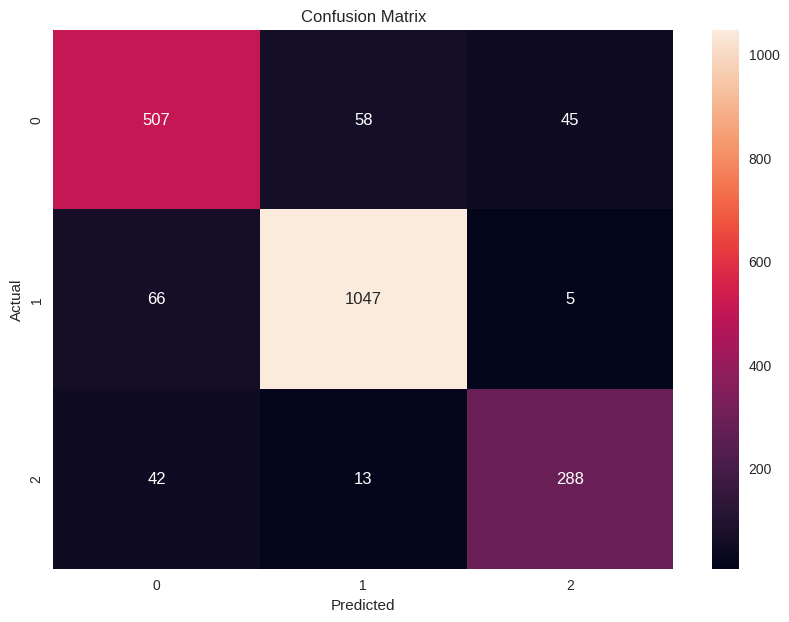

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

y_pred = best_grid.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
decoded_predictions = le.inverse_transform(y_pred)
decoded_predictions = le.inverse_transform(y_test)

print("Akurasi:", accuracy)
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt="d")
plt.title("Confusion Matrix")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

#### Kaggle Submission

In [ ]:
X_train


,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price
9366,55.740421,37.397090,8,1.0,1.0,20.0,35,1165.0,2,12574.0,1,5.0,5.0,43.9,1,0,9200000.0
5809,55.738404,37.489616,5,1.0,1.0,8.0,90,597.0,2,10800.0,1,9.0,12.0,44.4,3,0,11500000.0
10107,55.738404,37.749777,4,1.0,2.0,5.0,113,853.0,2,15539.0,1,9.0,12.0,50.0,3,0,10500000.0
5718,55.816414,37.818768,5,1.0,1.0,20.0,91,815.0,2,13108.0,0,4.0,9.0,32.8,3,0,7000000.0
9511,55.643033,37.710189,5,1.0,1.0,8.0,97,1356.0,2,13264.0,0,5.0,16.0,37.7,3,0,7000000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,55.754659,37.810072,7,1.0,1.0,19.0,75,390.0,2,12458.0,0,1.0,9.0,53.2,1,0,10200000.0
5191,55.734663,37.654062,0,1.0,2.0,3.0,140,815.0,2,2776.0,1,1.0,5.0,43.0,1,2,13700000.0
5390,55.766400,37.714222,5,1.0,1.0,4.0,35,504.0,2,5873.0,1,5.0,9.0,44.1,2,0,10200000.0
860,55.895040,37.607206,2,1.0,2.0,9.0,120,1269.0,2,14663.0,1,3.0,9.0,44.5,3,0,8700000.0


In [ ]:
cf_test = pd.read_csv("apartment_listings_test_classif.csv")
cf_test.head()

,ID,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price
0,MAL7619,55.822544,37.629135,SVAO,1.0,1.0,8.0,Rostokino,146.0,NaN,7775.0,NaN,3.0,22.0,60.0,panel,Enough,15000000.0
1,MAL6798,55.737370,37.425557,ZAO,1.0,NaN,NaN,Altufyevo,764.0,Underground,12574.0,Two Room,9.0,10.0,59.7,brick,Enough,17300000.0
2,MAL10124,55.799103,37.523000,NaN,1.0,5.0,5.0,Lubyanka,NaN,Underground,7556.0,NaN,4.0,14.0,48.0,block,NaN,12000000.0
3,MAL11868,55.871593,37.587120,SVAO,1.0,19.0,2.0,Orekhovo,1095.0,NaN,12882.0,Two Room,3.0,12.0,NaN,panel,Enough,9050000.0
4,MAL7749,55.720520,37.415532,ZAO,1.0,218.0,10.0,Zyuzino,726.0,Suburban rail,NaN,NaN,11.0,NaN,35.0,panel,Good,11250000.0


In [ ]:
cf_test_X = cf_test.drop(columns=['ID'])

In [ ]:
categorical_columns_cf_test = cf_test_X.select_dtypes(include=['object']).columns
print("Kolom berisi kategori:")
categorical_columns_cf_test

Kolom berisi kategori:


Index(['district', 'closest_subway', 'subway_grade', 'rooms', 'material',
       'repair'],
      dtype='object')

In [ ]:
# Encode
for col in categorical_columns_cf_test:
      cf_test_X[col] = le.fit_transform(cf_test_X[col])

In [ ]:
# Imputasi cf_test_X null

numerical_normal = ['longitude', 'subway_dist_to_center', 'latitude']
cf_test_X[numerical_normal] = cf_test_X[numerical_normal].fillna(cf_test_X[numerical_normal].mean())

numerical_skewed = ['address_offers', 'agent_offers', 'subway_offers', 'floor', 'dist_to_subway', 'max_floor', 'price', 'footage']
cf_test_X[numerical_skewed] = cf_test_X[numerical_skewed].fillna(cf_test_X[numerical_skewed].median())

categorical = ['district', 'closest_subway', 'subway_grade', 'rooms', 'material', 'repair']
cf_test_X[categorical] = cf_test_X[categorical].apply(lambda x: x.fillna(x.mode()[0]))

In [ ]:
cf_test_pred = best_grid.predict(cf_test_X)

In [ ]:
cf_test_pred

array([0, 2, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 2, 1, 1, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 2, 0, 1, 1, 1, 1, 1, 0, 2, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 2, 0, 1, 0, 2, 0, 2, 1, 1, 0, 0, 2, 2, 0, 1, 0, 1, 2, 0,
       2, 1, 0, 1, 0, 1, 2, 1, 2, 2, 1, 1, 0, 2, 2, 1, 1, 0, 1, 1, 0, 1,
       0, 2, 2, 2, 1, 0, 0, 2, 2, 2, 0, 1, 1, 0, 1, 2, 1, 1, 1, 1, 1, 2,
       1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 2, 1,
       2, 2, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 2, 1, 1, 1, 0, 0, 0,
       1, 2, 0, 0, 1, 1, 2, 1, 1, 1, 2, 0, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1,
       0, 2, 0, 2, 1, 1, 1, 1, 1, 1, 2, 1, 0, 0, 0, 1, 1, 2, 1, 1, 0, 2,
       1, 0, 2, 2, 1, 0, 1, 0, 0, 1, 1, 1, 2, 1, 2, 1, 1, 1, 0, 0, 2, 0,
       1, 1, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 2, 1, 2, 1, 0,
       2, 2, 0, 1, 2, 1, 1, 0, 1, 0, 0, 0, 2, 1, 1, 2, 0, 1, 1, 1, 1, 0,
       1, 0, 1, 2, 2, 1, 1, 0, 2, 0, 1, 1, 1, 1, 0, 0, 2, 0, 1, 1, 2, 1,
       1, 0, 1, 0, 0, 2, 1, 0, 1, 0, 0, 0, 1, 2, 1,

In [ ]:
# Mapping values to categories
age_category_mapping = {2: "Young buildings", 0: "Middle-aged buildings", 1: "Old buildings"}

In [ ]:
cf_test_pred_converted = np.vectorize(age_category_mapping.get)(cf_test_pred)

In [ ]:
submit_cf = pd.DataFrame({'ID': cf_test['ID'], 'category_age': cf_test_pred_converted})
submit_cf

,ID,category_age
0,MAL7619,Middle-aged buildings
1,MAL6798,Young buildings
2,MAL10124,Old buildings
3,MAL11868,Old buildings
4,MAL7749,Old buildings
...,...,...
909,MAL1100,Young buildings
910,MAL10975,Young buildings
911,MAL10831,Old buildings
912,MAL5303,Young buildings


In [ ]:
submit_cf.to_csv('submit_cf.csv', index=False)

## B. Regression

Buatlah model untuk memprediksi harga jual dari apartemen

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score

#### Preprocessing for regression

In [ ]:
# Load dataset
data_rg = data.copy()

Handle Outliers

In [ ]:
categorical = ['district', 'closest_subway', 'subway_grade', 'rooms', 'material', 'repair','ID', 'category_age']

Text(0.5, 1.0, 'Visualisasi Outlier pada Data Numerik')

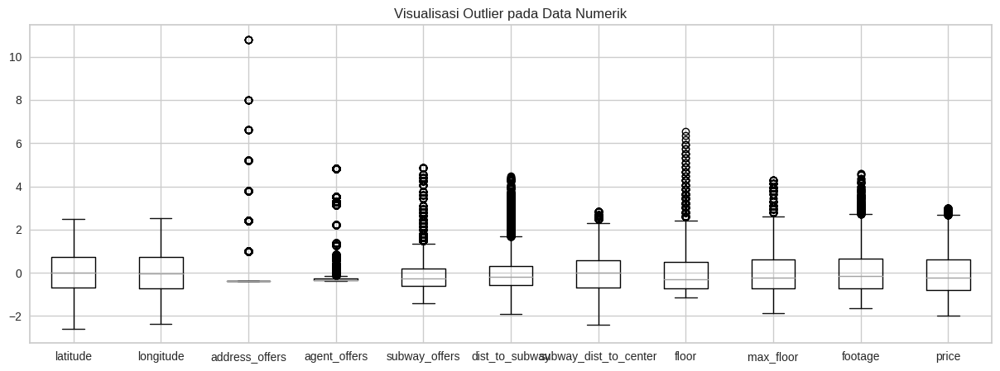

In [ ]:
# Import libraries
from sklearn.preprocessing import StandardScaler

# Drop data kategorikal
df_viz_outlier = data_rg.drop(categorical, axis=1)

# Scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_viz_outlier)

# Visualisasi Outlier
viz_outlier = pd.DataFrame(scaled_data)
viz_outlier.columns = df_viz_outlier.columns.values.tolist()
viz_outlier.boxplot(figsize=(15,5))
plt.title("Visualisasi Outlier pada Data Numerik")

In [ ]:
from tabulate import tabulate

In [ ]:
# Membuat fungsi count outliers
def count_outliers(data):
    results = []

    for dataname in data:
        sorted_data = data.sort_values(by=[dataname])

        q1 = sorted_data[dataname].quantile(0.25)
        q3 = sorted_data[dataname].quantile(0.75)

        iqr = q3 - q1
        lower = q1 - (iqr * 1.5)
        upper = q3 + (iqr * 1.5)
        above_upper = len(data.loc[data[dataname] > upper])
        below_lower = len(data.loc[data[dataname] < lower])
        outliers = above_upper + below_lower
        total = data[dataname].notnull().sum()
        p = outliers / total * 100

        result_dict = {
            "Column": dataname,
            "Total Outliers": outliers,
            "%": round(p, 2),
            "Lower Bound": round(lower, 2),
            "Upper Bound": round(upper, 2),
            "Data Below LB": below_lower,
            "Data Above UB": above_upper,
            "Min Value": data[dataname].min(),
            "Max Value": data[dataname].max(),
        }
        results.append(result_dict)

    # Convert results to a DataFrame for tabulation
    results_df = pd.DataFrame(results)

    # Right-align numeric columns
    num_cols = results_df.select_dtypes(include=['number']).columns
    colalign = ['right' if col in num_cols else 'left' for col in results_df.columns]

    # Display the tabulated results with right-aligned numeric columns
    print(tabulate(results_df, headers='keys', tablefmt='pretty', showindex=False, colalign=colalign))

In [ ]:
count_outliers(df_viz_outlier)

+-----------------------+----------------+-------+-------------+-------------+---------------+---------------+------------+------------+
| Column                | Total Outliers |     % | Lower Bound | Upper Bound | Data Below LB | Data Above UB |  Min Value |  Max Value |
+-----------------------+----------------+-------+-------------+-------------+---------------+---------------+------------+------------+
| latitude              |              0 |   0.0 |       55.51 |       55.97 |             0 |             0 | 55.5276313 | 55.9415774 |
| longitude             |              0 |   0.0 |       37.24 |        38.0 |             0 |             0 |  37.306055 |  37.950668 |
| address_offers        |           1926 |  18.6 |         1.0 |         1.0 |             0 |          1926 |        1.0 |        9.0 |
| agent_offers          |           1824 | 17.62 |        -6.5 |        13.5 |             0 |          1824 |        0.0 |      292.0 |
| subway_offers         |            909 

Terlihat bahwa terdapat outlier pada seluruh atribut numerikal kecuali latitude dan longitude.

Kami akan melakukan outliers handling dengan metode capping

In [ ]:
columns_to_cap = df_viz_outlier.columns.tolist()

df_viz_outlier_new = pd.DataFrame()

for column in columns_to_cap:
    q1 = df_viz_outlier[column].quantile(0.25)
    q3 = df_viz_outlier[column].quantile(0.75)

    # Calculate IQR
    IQR = q3 - q1

    # Define max and min limits
    max_limit = q3 + (1.5 * IQR)
    min_limit = q1 - (1.5 * IQR)

    # Perform capping on the current column
    df_viz_outlier_new[column] = pd.DataFrame(np.where(df_viz_outlier[column] > max_limit, max_limit,
                                                np.where(df_viz_outlier[column] < min_limit, min_limit, df_viz_outlier[column])),
                                       columns=[column])

In [ ]:
df_viz_outlier_new.head()

,latitude,longitude,address_offers,agent_offers,subway_offers,dist_to_subway,subway_dist_to_center,floor,max_floor,footage,price
0,55.702410,37.940178,1.0,1.0,18.0,763.0,20323.0,9.0,12.0,40.0,8200000.0
1,55.709341,37.764728,1.0,1.0,15.0,437.0,10612.0,9.0,17.0,66.0,14000000.0
2,55.820905,37.579699,1.0,1.0,12.0,319.0,7829.0,3.0,9.0,32.5,9100000.0
3,55.691564,37.806339,1.0,1.0,11.0,1684.0,13469.0,6.0,14.0,37.9,7600000.0
4,55.675570,37.682594,1.0,1.0,12.0,1201.0,8849.0,12.0,12.0,42.0,10300000.0


In [ ]:
count_outliers(df_viz_outlier_new)

+-----------------------+----------------+-----+-------------+-------------+---------------+---------------+------------+-------------------+
| Column                | Total Outliers |   % | Lower Bound | Upper Bound | Data Below LB | Data Above UB |  Min Value |         Max Value |
+-----------------------+----------------+-----+-------------+-------------+---------------+---------------+------------+-------------------+
| latitude              |              0 | 0.0 |       55.51 |       55.97 |             0 |             0 | 55.5276313 |        55.9415774 |
| longitude             |              0 | 0.0 |       37.24 |        38.0 |             0 |             0 |  37.306055 |         37.950668 |
| address_offers        |              0 | 0.0 |         1.0 |         1.0 |             0 |             0 |        1.0 |               1.0 |
| agent_offers          |              0 | 0.0 |        -6.5 |        13.5 |             0 |             0 |        0.0 |              13.5 |
| subw

In [ ]:
# Mengupdate data dengan data yang tanpa outlier
data_rg.update(df_viz_outlier_new)

In [ ]:
data_rg

,ID,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price,category_age
0,MAL2617,55.702410,37.940178,UVAO,1.0,1.0,18.0,Dmitrievskaya,763.0,Underground,20323.0,One Room,9.0,12.0,40.0,panel,Good,8200000.0,Young buildings
1,MAL228,55.709341,37.764728,UVAO,1.0,1.0,15.0,Kiyevskaya,437.0,Underground,10612.0,Two Room,9.0,17.0,66.0,monolith,Excellent,14000000.0,Middle-aged buildings
2,MAL8415,55.820905,37.579699,SVAO,1.0,1.0,12.0,Vystavochny Tsentr,319.0,Underground,7829.0,One Room,3.0,9.0,32.5,block,Excellent,9100000.0,Old buildings
3,MAL3008,55.691564,37.806339,UVAO,1.0,1.0,11.0,Kashirskaya,1684.0,Underground,13469.0,Two Room,6.0,14.0,37.9,block,Poor,7600000.0,Old buildings
4,MAL1690,55.675570,37.682594,UAO,1.0,1.0,12.0,Izmaylovskaya,1201.0,Underground,8849.0,Two Room,12.0,12.0,42.0,block,Enough,10300000.0,Old buildings
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10348,MAL8945,55.638211,37.363726,ZAO,1.0,1.0,7.0,Polyanka,586.0,Underground,20688.0,Two Room,11.0,12.0,51.5,panel,Enough,10500000.0,Middle-aged buildings
10349,MAL11837,55.633076,37.610935,UAO,1.0,1.0,8.0,ZIL,815.0,Underground,12436.0,Two Room,10.0,18.0,58.6,panel,Enough,14300000.0,Middle-aged buildings
10350,MAL11260,55.723364,37.607906,CAO,1.0,11.0,4.0,Verkhnie Kotly,504.0,Underground,3744.0,Two Room,8.0,9.0,38.0,panel,Enough,11500000.0,Old buildings
10351,MAL4476,55.738404,37.753964,UVAO,1.0,2.0,16.0,Ulitsa Starokachalovskaya,815.0,Underground,9000.0,One Room,16.0,23.0,42.0,monolith,Good,11000000.0,Middle-aged buildings


Prepare Data

In [ ]:
# Select Features
X = data_rg.drop(['ID', 'price'], axis=1)
y = data_rg['price']

In [ ]:
# Define numerical and categorical features
numerical_features = X.select_dtypes(include=['float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

# Create preprocessors for numerical and categorical features
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())  # Standardize numerical features
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine numerical and categorical preprocessors
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [ ]:
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#### Random Forest Regressor

In [ ]:
# Create a pipeline with preprocessor and model
model_rf = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', RandomForestRegressor(random_state=42))])

# Train the model
model_rf.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['latitude', 'longitude', 'address_offers', 'agent_offers',
       'subway_offers', 'dist_to_subway', 'subway_dist_to_center', 'floor',
       'max_floor', 'footage'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['district', 'closest_subway', 'subway_grade', 'rooms', 'material',
       'repair', 'category_age'],
      dtype='object'))])),
                ('regressor', RandomForestRegressor(random_state=42))])

In [ ]:
# Evaluate the model
y_pred = model_rf.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')

Mean Squared Error (MSE): 1889507718303.2764
Mean Squared Error (RMSE): 1374593.6557045782
R-squared (R2): 0.7930625889654854


In [ ]:
# Cross-validation
cv_scores = cross_val_score(model_rf, X, y, cv=5, scoring='neg_mean_squared_error')
mean_cv_score = -cv_scores.mean()
mean_cv_rmse = (-cv_scores.mean())**0.5
cv_r2_scores = cross_val_score(model_rf, X, y, cv=5, scoring='r2')
mean_cv_r2 = cv_r2_scores.mean()

print(f'Mean Cross-Validation Squared Error (MSE): {mean_cv_score}')
print(f'Mean Cross-Validation Squared Error (RMSE): {mean_cv_rmse}')
print(f'Mean Cross-Validation R-squared (R2): {mean_cv_r2}')

Mean Cross-Validation Squared Error (MSE): 1819498391637.3413
Mean Cross-Validation Squared Error (RMSE): 1348887.835083904
Mean Cross-Validation R-squared (R2): 0.8001166386789968


#### Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
# Create a pipeline with preprocessor and model
model_lr = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', LinearRegression())])
# Train the model
model_lr.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['latitude', 'longitude', 'address_offers', 'agent_offers',
       'subway_offers', 'dist_to_subway', 'subway_dist_to_center', 'floor',
       'max_floor', 'footage'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['district', 'closest_subway', 'subway_grade', 'rooms', 'material',
       'repair', 'category_age'],
      dtype='object'))])),
                ('regressor', LinearRegression())])

In [ ]:
# Evaluate the model
y_pred = model_lr.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')

Mean Squared Error (MSE): 2302268371975.446
Mean Squared Error (RMSE): 1517322.7646006783
R-squared (R2): 0.7478573642286777


In [ ]:
# Cross-validation
cv_scores = cross_val_score(model_lr, X, y, cv=5, scoring='neg_mean_squared_error')
mean_cv_score = -cv_scores.mean()
mean_cv_rmse = (-cv_scores.mean())**0.5
cv_r2_scores = cross_val_score(model_lr, X, y, cv=5, scoring='r2')
mean_cv_r2 = cv_r2_scores.mean()

print(f'Mean Cross-Validation Squared Error (MSE): {mean_cv_score}')
print(f'Mean Cross-Validation Squared Error (RMSE): {mean_cv_rmse}')
print(f'Mean Cross-Validation R-squared (R2): {mean_cv_r2}')

Mean Cross-Validation Squared Error (MSE): 2233370200029.1343
Mean Cross-Validation Squared Error (RMSE): 1494446.4527138916
Mean Cross-Validation R-squared (R2): 0.7546836490292131


#### Decision Tree Regressor

In [ ]:
from sklearn.tree import DecisionTreeRegressor

In [ ]:
# Create a pipeline with preprocessor and model
model_dt = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', DecisionTreeRegressor(random_state=42))])

# Train the model
model_dt.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['latitude', 'longitude', 'address_offers', 'agent_offers',
       'subway_offers', 'dist_to_subway', 'subway_dist_to_center', 'floor',
       'max_floor', 'footage'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['district', 'closest_subway', 'subway_grade', 'rooms', 'material',
       'repair', 'category_age'],
      dtype='object'))])),
                ('regressor', DecisionTreeRegressor(random_state=42))])

In [ ]:
# Evaluate the model
y_pred = model_dt.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')

Mean Squared Error (MSE): 3515279488459.2896
Mean Squared Error (RMSE): 1874907.8613252677
R-squared (R2): 0.6150093331940867


In [ ]:
# Cross-validation
cv_scores = cross_val_score(model_dt, X, y, cv=5, scoring='neg_mean_squared_error')
mean_cv_score = -cv_scores.mean()
mean_cv_rmse = (-cv_scores.mean())**0.5
cv_r2_scores = cross_val_score(model_dt, X, y, cv=5, scoring='r2')
mean_cv_r2 = cv_r2_scores.mean()

print(f'Mean Cross-Validation Squared Error (MSE): {mean_cv_score}')
print(f'Mean Cross-Validation Squared Error (RMSE): {mean_cv_rmse}')
print(f'Mean Cross-Validation R-squared (R2): {mean_cv_r2}')

Mean Cross-Validation Squared Error (MSE): 3661490172018.875
Mean Cross-Validation Squared Error (RMSE): 1913502.0700325556
Mean Cross-Validation R-squared (R2): 0.597825668844524


#### Gradient Boosting Regressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
# Create a pipeline with preprocessor and model
model_gb = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', GradientBoostingRegressor(random_state=42))])

# Train the model
model_gb.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['latitude', 'longitude', 'address_offers', 'agent_offers',
       'subway_offers', 'dist_to_subway', 'subway_dist_to_center', 'floor',
       'max_floor', 'footage'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['district', 'closest_subway', 'subway_grade', 'rooms', 'material',
       'repair', 'category_age'],
      dtype='object'))])),
                ('regressor', GradientBoostingRegressor(random_state=42))])

In [ ]:
# Evaluate the model
y_pred = model_gb.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')

Mean Squared Error (MSE): 2079762170349.252
Mean Squared Error (RMSE): 1442138.055232318
R-squared (R2): 0.7722260698220028


In [ ]:
# Cross-validation
cv_scores = cross_val_score(model_gb, X, y, cv=5, scoring='neg_mean_squared_error')
mean_cv_score = -cv_scores.mean()
mean_cv_rmse = (-cv_scores.mean())**0.5
cv_r2_scores = cross_val_score(model_gb, X, y, cv=5, scoring='r2')
mean_cv_r2 = cv_r2_scores.mean()

print(f'Mean Cross-Validation Squared Error (MSE): {mean_cv_score}')
print(f'Mean Cross-Validation Squared Error (RMSE): {mean_cv_rmse}')
print(f'Mean Cross-Validation R-squared (R2): {mean_cv_r2}')

Mean Cross-Validation Squared Error (MSE): 2025694635406.1138
Mean Cross-Validation Squared Error (RMSE): 1423268.9961515053
Mean Cross-Validation R-squared (R2): 0.7775202054147664


#### Support Vector Machine (SVM) Regressor

In [ ]:
from sklearn.svm import SVR

In [ ]:
# Create a pipeline with preprocessor and model
model_svm = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', SVR())])

# Train the model
model_svm.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['latitude', 'longitude', 'address_offers', 'agent_offers',
       'subway_offers', 'dist_to_subway', 'subway_dist_to_center', 'floor',
       'max_floor', 'footage'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  Index(['district', 'closest_subway', 'subway_grade', 'rooms', 'material',
       'repair', 'category_age'],
      dtype='object'))])),
                ('regressor', SVR())])

In [ ]:
# Evaluate the model
y_pred = model_svm.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')

Mean Squared Error (MSE): 9547252820902.873
Mean Squared Error (RMSE): 3089862.912962786
R-squared (R2): -0.04560767977371061


In [ ]:
# Cross-validation
cv_scores = cross_val_score(model_svm, X, y, cv=5, scoring='neg_mean_squared_error')
mean_cv_score = -cv_scores.mean()
mean_cv_rmse = (-cv_scores.mean())**0.5
cv_r2_scores = cross_val_score(model_svm, X, y, cv=5, scoring='r2')
mean_cv_r2 = cv_r2_scores.mean()

print(f'Mean Cross-Validation Squared Error (MSE): {mean_cv_score}')
print(f'Mean Cross-Validation Squared Error (RMSE): {mean_cv_rmse}')
print(f'Mean Cross-Validation R-squared (R2): {mean_cv_r2}')

Mean Cross-Validation Squared Error (MSE): 9555114150055.027
Mean Cross-Validation Squared Error (RMSE): 3091134.767371851
Mean Cross-Validation R-squared (R2): -0.04965828518589484


#### XGBoost Regressor

In [ ]:
from xgboost import XGBRegressor

In [ ]:
# Create a pipeline with preprocessor and model
model_xgb = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', XGBRegressor(random_state=42))])
# Train the model
model_xgb.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['latitude', 'longitude', 'address_offers', 'agent_offers',
       'subway_offers', 'dist_to_subway', 'subway_dist_to_center', 'floor',
       'max_floor', 'footage'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   Simp...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=42, ...))])

In [ ]:
# Evaluate the model
y_pred = model_xgb.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R2): {r2}')

Mean Squared Error (MSE): 1737436967644.1184
Mean Squared Error (RMSE): 1318118.7228941552
R-squared (R2): 0.8097172589256271


In [ ]:
# Cross-validation
cv_scores = cross_val_score(model_xgb, X, y, cv=5, scoring='neg_mean_squared_error')
mean_cv_score = -cv_scores.mean()
mean_cv_rmse = (-cv_scores.mean())**0.5
cv_r2_scores = cross_val_score(model_xgb, X, y, cv=5, scoring='r2')
mean_cv_r2 = cv_r2_scores.mean()

print(f'Mean Cross-Validation Squared Error (MSE): {mean_cv_score}')
print(f'Mean Cross-Validation Squared Error (RMSE): {mean_cv_rmse}')
print(f'Mean Cross-Validation R-squared (R2): {mean_cv_r2}')

Mean Cross-Validation Squared Error (MSE): 1709493414849.7935
Mean Cross-Validation Squared Error (RMSE): 1307475.9710410717
Mean Cross-Validation R-squared (R2): 0.8122252847671302


Dikarenakan XGBoost memiliki R-squared yang lebih tinggi di antara semuanya, kami memilih XGBoost

#### Visualisasi Grafik

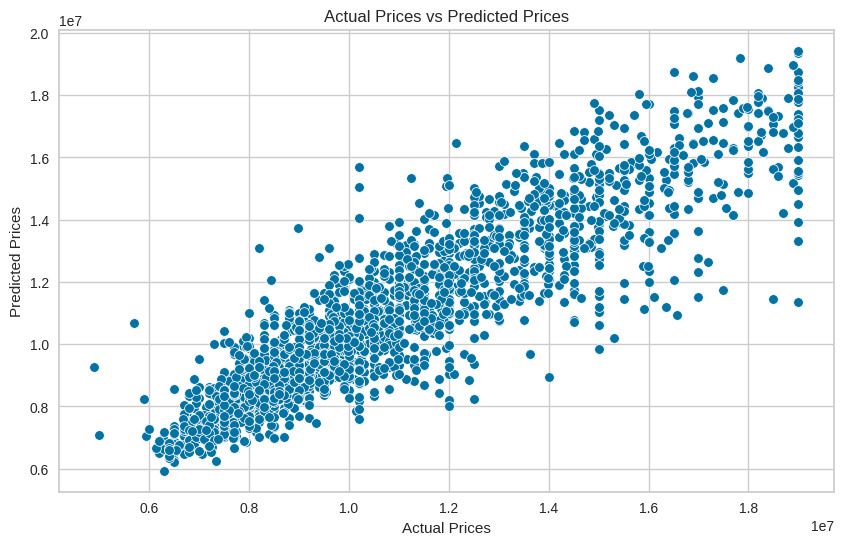

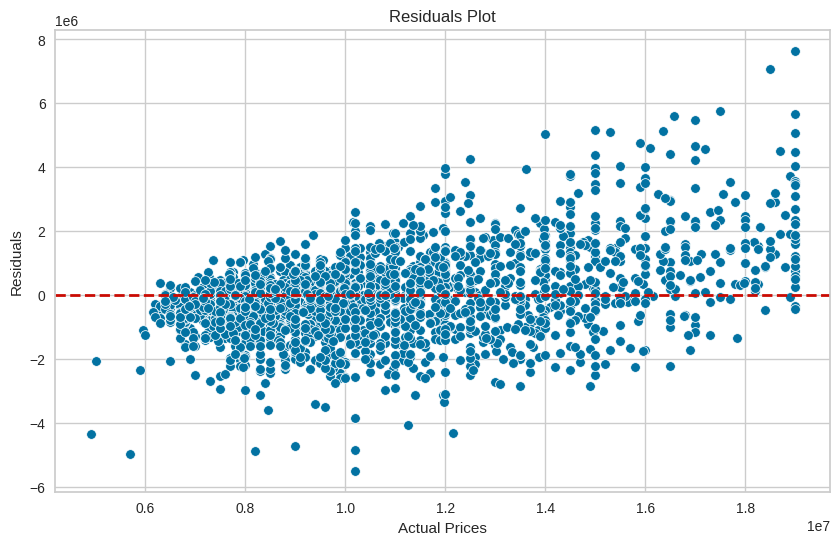

In [ ]:
# Plotting the actual vs predicted prices
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred)
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual Prices vs Predicted Prices')
plt.show()

# Plotting the residuals
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=residuals)
plt.axhline(y=0, color='r', linestyle='--', linewidth=2)
plt.xlabel('Actual Prices')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.show()

#### Kaggle Submission

In [ ]:
X_train

,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,category_age
9366,55.740421,37.397090,ZAO,1.0,1.0,18.5,Dmitrievskaya,1165.0,Underground,12574.0,Two Room,5.0,5.0,43.9,brick,Enough,Old buildings
5809,55.738404,37.489616,UVAO,1.0,1.0,8.0,Novokosino,597.0,Underground,10800.0,Two Room,9.0,12.0,44.4,panel,Enough,Old buildings
10107,55.738404,37.749777,UAO,1.0,2.0,5.0,Prokshino,853.0,Underground,15539.0,Two Room,9.0,12.0,50.0,panel,Enough,Old buildings
5718,55.816414,37.818768,UVAO,1.0,1.0,18.5,Novokuznetskaya,815.0,Underground,13108.0,One Room,4.0,9.0,32.8,panel,Enough,Old buildings
9511,55.643033,37.710189,UVAO,1.0,1.0,8.0,Otradnoye,1356.0,Underground,13264.0,One Room,5.0,16.0,37.7,panel,Enough,Middle-aged buildings
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,55.754659,37.810072,VAO,1.0,1.0,18.5,Mendeleyevskaya,390.0,Underground,12458.0,One Room,1.0,9.0,53.2,brick,Enough,Middle-aged buildings
5191,55.734663,37.654062,CAO,1.0,2.0,3.0,Sviblovo,815.0,Underground,2776.0,Two Room,1.0,5.0,43.0,brick,Good,Old buildings
5390,55.766400,37.714222,UVAO,1.0,1.0,4.0,Dmitrievskaya,504.0,Underground,5873.0,Two Room,5.0,9.0,44.1,monolith,Enough,Old buildings
860,55.895040,37.607206,SVAO,1.0,2.0,9.0,Rumyantsevo,1269.0,Underground,14663.0,Two Room,3.0,9.0,44.5,panel,Enough,Old buildings


In [ ]:
rg_test = pd.read_csv("data_regresi_test.csv")
rg_test.head()

,ID,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,category_age
0,MAL10259,55.702824,37.569970,UZAO,1.0,NaN,1.0,Tekhnopark,NaN,Underground,6020.0,Two Room,5.0,9.0,61.2,brick,Good,Old buildings
1,MAL1646,55.681367,37.695684,UAO,1.0,11.0,17.0,Izmaylovskaya,NaN,Underground,8849.0,Two Room,2.0,NaN,55.6,panel,Good,Young buildings
2,MAL11569,55.819312,37.711931,VAO,1.0,NaN,NaN,Vorobyovy Gory,NaN,Urban rail,10153.0,One Room,7.0,9.0,NaN,monolith,Enough,Old buildings
3,MAL3305,55.882575,37.533140,SAO,NaN,1.0,20.0,Mnyovniki,1983.0,Underground,13417.0,Two Room,6.0,9.0,44.0,panel,Enough,Old buildings
4,MAL10556,55.722274,37.647450,NaN,1.0,20.0,NaN,Ulitsa Akademika Yangelya,1114.0,Underground,2771.0,Two Room,1.0,5.0,56.0,brick,Good,Old buildings


In [ ]:
rg_test_X = rg_test.drop(columns=['ID'])

In [ ]:
# Imputasi rg_test_X null

numerical_normal = ['longitude', 'subway_dist_to_center', 'latitude']
rg_test_X[numerical_normal] = rg_test_X[numerical_normal].fillna(rg_test_X[numerical_normal].mean())

numerical_skewed = ['address_offers', 'agent_offers', 'subway_offers', 'floor', 'dist_to_subway', 'max_floor', 'footage']
rg_test_X[numerical_skewed] = rg_test_X[numerical_skewed].fillna(rg_test_X[numerical_skewed].median())

categorical = ['district', 'closest_subway', 'subway_grade', 'rooms', 'material', 'repair', 'category_age']
rg_test_X[categorical] = rg_test_X[categorical].apply(lambda x: x.fillna(x.mode()[0]))

Text(0.5, 1.0, 'Visualisasi Outlier pada Data Numerik')

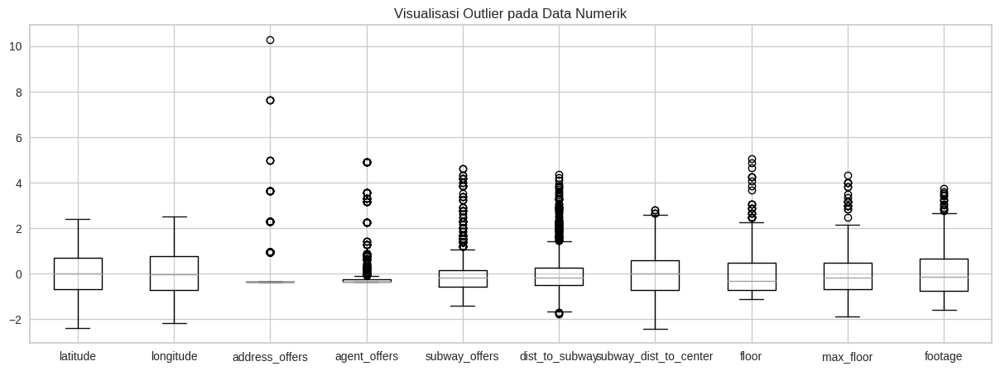

In [ ]:
# Drop data kategorikal
df_viz_outlier = rg_test_X.drop(categorical, axis=1)

# Scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_viz_outlier)

# Visualisasi Outlier
viz_outlier = pd.DataFrame(scaled_data)
viz_outlier.columns = df_viz_outlier.columns.values.tolist()
viz_outlier.boxplot(figsize=(15,5))
plt.title("Visualisasi Outlier pada Data Numerik")

In [ ]:
count_outliers(df_viz_outlier)

+-----------------------+----------------+-------+-------------+-------------+---------------+---------------+------------+------------+
| Column                | Total Outliers |     % | Lower Bound | Upper Bound | Data Below LB | Data Above UB |  Min Value |  Max Value |
+-----------------------+----------------+-------+-------------+-------------+---------------+---------------+------------+------------+
| latitude              |              0 |   0.0 |        55.5 |       55.97 |             0 |             0 |   55.53494 | 55.9415774 |
| longitude             |              0 |   0.0 |       37.24 |       38.01 |             0 |             0 | 37.3401606 |  37.948898 |
| address_offers        |            158 | 17.42 |         1.0 |         1.0 |             0 |           158 |        1.0 |        9.0 |
| agent_offers          |            151 | 16.65 |        -8.0 |        16.0 |             0 |           151 |        1.0 |      292.0 |
| subway_offers         |            105 

In [ ]:
columns_to_cap = df_viz_outlier.columns.tolist()

df_viz_outlier_new = pd.DataFrame()

for column in columns_to_cap:
    q1 = df_viz_outlier[column].quantile(0.25)
    q3 = df_viz_outlier[column].quantile(0.75)

    # Calculate IQR
    IQR = q3 - q1

    # Define max and min limits
    max_limit = q3 + (1.5 * IQR)
    min_limit = q1 - (1.5 * IQR)

    # Perform capping on the current column
    df_viz_outlier_new[column] = pd.DataFrame(np.where(df_viz_outlier[column] > max_limit, max_limit,
                                                np.where(df_viz_outlier[column] < min_limit, min_limit, df_viz_outlier[column])),
                                       columns=[column])

In [ ]:
count_outliers(df_viz_outlier_new)

+-----------------------+----------------+-----+-------------+-------------+---------------+---------------+------------+------------+
| Column                | Total Outliers |   % | Lower Bound | Upper Bound | Data Below LB | Data Above UB |  Min Value |  Max Value |
+-----------------------+----------------+-----+-------------+-------------+---------------+---------------+------------+------------+
| latitude              |              0 | 0.0 |        55.5 |       55.97 |             0 |             0 |   55.53494 | 55.9415774 |
| longitude             |              0 | 0.0 |       37.24 |       38.01 |             0 |             0 | 37.3401606 |  37.948898 |
| address_offers        |              0 | 0.0 |         1.0 |         1.0 |             0 |             0 |        1.0 |        1.0 |
| agent_offers          |              0 | 0.0 |        -8.0 |        16.0 |             0 |             0 |        1.0 |       16.0 |
| subway_offers         |              0 | 0.0 |       

In [ ]:
# Mengupdate data dengan data yang tanpa outlier
rg_test_X.update(df_viz_outlier_new)

In [ ]:
rg_test_pred = model_xgb.predict(rg_test_X)

In [ ]:
rg_test_pred

array([17018978. , 13268299. ,  9554802. ,  8581635. , 11694667. ,
        8678890. , 11580214. , 13000588. , 11214808. , 10195036. ,
        9608666. , 12993439. , 10571723. ,  9401140. , 17349670. ,
        9211258. ,  7658138. ,  9341504. ,  8705898. ,  7844025.5,
       16271368. ,  9578094. ,  7250332.5,  9903578. ,  9571519. ,
       13935277. ,  8216671. ,  8038971. ,  8645296. , 14728485. ,
        8979526. ,  9959054. ,  7409959. , 10561852. ,  8546617. ,
        8800541. ,  9189728. , 15528759. ,  8420449. , 13038988. ,
        7660020.5,  8217493.5,  9652068. , 12142234. ,  8258644.5,
        8512925. , 10504712. ,  8955903. , 16025233. , 17235226. ,
        7355491.5,  9684328. ,  8652808. ,  7230898.5,  8647744. ,
        6745211.5,  7855088.5, 14270640. ,  8880454. ,  7650306. ,
        8579015. , 13064455. ,  9595985. , 11436790. , 11239387. ,
       10303602. , 11601719. , 12189685. , 11660409. , 12909642. ,
       11814913. , 16269895. , 11790721. , 12902961. , 1124155

In [ ]:
submit_rg = pd.DataFrame({'ID': rg_test['ID'], 'price': rg_test_pred})
submit_rg

,ID,price
0,MAL10259,17018978.0
1,MAL1646,13268299.0
2,MAL11569,9554802.0
3,MAL3305,8581635.0
4,MAL10556,11694667.0
...,...,...
902,MAL9523,12395568.0
903,MAL5796,12494215.0
904,MAL6743,19068872.0
905,MAL9538,11868911.0


In [ ]:
submit_rg.to_csv('submit_rg.csv', index=False)

## C. Clustering & Clustering Analysis

Melakukan clustering pada dataset dan memberikan analisis dari jenis-jenis apartemen yang
terdapat dalam suatu cluster

In [ ]:
# Impor library dan modul yang dibutuhkan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import scipy.cluster.hierarchy as shc

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer # jika tidak bisa, jalankan command "pip install yellowbrick"
from sklearn.cluster import AgglomerativeClustering

from sklearn.decomposition import PCA

In [ ]:
# memperbesar font visualisasi
plt.rcParams.update({'font.size':15})

### Data Preparing

In [ ]:
# Mount google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Open Dataset in Drive Folder
df = pd.read_csv('/content/gdrive/MyDrive/DATAMPAN/AL_Train.csv')

# Melihat shape data
rows, cols = df.shape
print(f"Dataset ini memiliki {cols} kolom dan {rows} atribut\n")

df

Dataset ini memiliki 19 kolom dan 10353 atribut



,ID,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price,category_age
0,MAL2617,55.702410,37.940178,UVAO,1.0,NaN,18.0,Dmitrievskaya,763.0,Underground,20323.0,One Room,9.0,NaN,40.0,panel,Good,8200000.0,Young buildings
1,MAL228,55.709341,37.764728,UVAO,1.0,1.0,15.0,Kiyevskaya,437.0,Underground,10612.0,Two Room,9.0,17.0,66.0,monolith,Excellent,14000000.0,Middle-aged buildings
2,MAL8415,55.820905,37.579699,SVAO,1.0,1.0,12.0,Vystavochny Tsentr,319.0,Underground,7829.0,One Room,3.0,9.0,32.5,block,Excellent,9100000.0,Old buildings
3,MAL3008,55.691564,37.806339,UVAO,1.0,1.0,11.0,Kashirskaya,2234.0,Underground,13469.0,Two Room,6.0,14.0,37.9,block,Poor,7600000.0,Old buildings
4,MAL1690,55.675570,37.682594,UAO,1.0,1.0,12.0,Izmaylovskaya,1201.0,Underground,8849.0,Two Room,12.0,NaN,42.0,block,Enough,10300000.0,Old buildings
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10348,MAL8945,55.638211,37.363726,ZAO,1.0,1.0,7.0,Polyanka,586.0,NaN,20688.0,Two Room,11.0,NaN,51.5,panel,Enough,10500000.0,Middle-aged buildings
10349,MAL11837,55.633076,37.610935,UAO,1.0,NaN,NaN,ZIL,NaN,Underground,12436.0,Two Room,10.0,18.0,58.6,panel,NaN,14300000.0,Middle-aged buildings
10350,MAL11260,55.723364,37.607906,CAO,1.0,11.0,4.0,Verkhnie Kotly,504.0,Underground,3744.0,Two Room,8.0,9.0,38.0,panel,NaN,11500000.0,Old buildings
10351,MAL4476,NaN,37.753964,UVAO,1.0,2.0,16.0,Ulitsa Starokachalovskaya,NaN,Underground,9000.0,One Room,16.0,23.0,42.0,monolith,Good,11000000.0,Middle-aged buildings


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10353 entries, 0 to 10352
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     10353 non-null  object 
 1   latitude               8979 non-null   float64
 2   longitude              9951 non-null   float64
 3   district               9173 non-null   object 
 4   address_offers         9884 non-null   float64
 5   agent_offers           8430 non-null   float64
 6   subway_offers          7772 non-null   float64
 7   closest_subway         9319 non-null   object 
 8   dist_to_subway         7792 non-null   float64
 9   subway_grade           9556 non-null   object 
 10  subway_dist_to_center  9215 non-null   float64
 11  rooms                  8999 non-null   object 
 12  floor                  8515 non-null   float64
 13  max_floor              9114 non-null   float64
 14  footage                8618 non-null   float64
 15  ma

Deskripsi Kolom
* `ID`: ID yang unik untuk setiap apartemen.
* `latitude`: Nilai latitude (garis lintang) untuk apartemen yang sesuai.
* `longitude`: Nilai longitude (garis bujur) untuk apartemen yang sesuai.
* `district`: Distrik atau wilayah di mana apartemen berada.
* `address_offers`: Jumlah tawaran atau penawaran yang
terkait dengan alamat apartemen.
* `agent_offers`: Jumlah tawaran atau penawaran yang
terkait dengan agen properti yang berhubungan dengan
apartemen.
* `subway_offers`: Jumlah tawaran atau penawaran yang
terkait dengan stasiun kereta yang berdekatan dengan
apartemen.
* `closest_subway`: Stasiun kereta terdekat dengan
apartemen.
* `dist_to_subway`:
Jarak antara apartemen dan stasiun kereta terdekat.
* `subway_grade`: Kelas stasiun kereta yang berdekatan dengan apartemen.
* `subway_dist_to_center`:
Jarak antara stasiun kereta terdekat dan pusat kota.
* `rooms`: Jumlah kamar di apartemen.
* `floor`: Lantai tempat apartment berada.
* `max_floor`: Jumlah lantai maksimum dalam bangunan
di mana apartemen berada.
* `footage`: Luas dari apartemen.
* `material`: Informasi tentang bahan bangunan
apartemen.
* `repair`: Kondisi perbaikan apartemen.
* `category_age`: Kategori usia apartemen.
* `price`: Harga apartemen.

array([[<Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'longitude'}>,
        <Axes: title={'center': 'address_offers'}>],
       [<Axes: title={'center': 'agent_offers'}>,
        <Axes: title={'center': 'subway_offers'}>,
        <Axes: title={'center': 'dist_to_subway'}>],
       [<Axes: title={'center': 'subway_dist_to_center'}>,
        <Axes: title={'center': 'floor'}>,
        <Axes: title={'center': 'max_floor'}>],
       [<Axes: title={'center': 'footage'}>,
        <Axes: title={'center': 'price'}>, <Axes: >]], dtype=object)

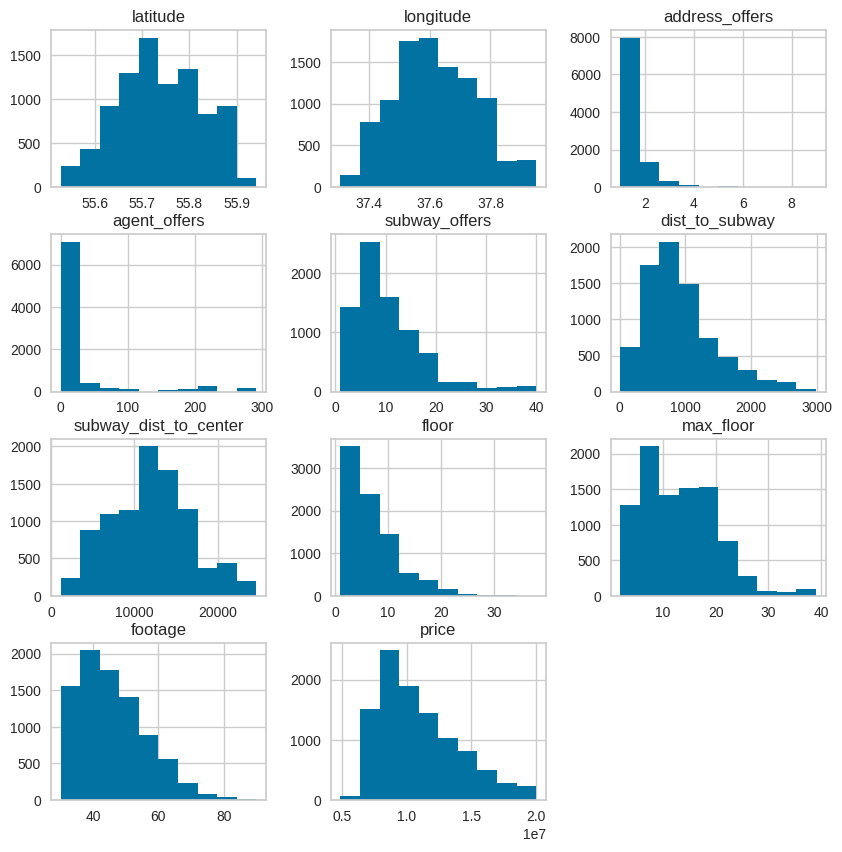

In [ ]:
# See overall distribution
df.hist(figsize=(10,10))

### Data Preprocessing



In [ ]:
df_cleaned = df.copy()

#### Data Selection

* `ID` akan didrop karena hanya sebagai unique identifier dan tidak ada additional value

In [ ]:
df_cleaned= df_cleaned.drop('ID', axis=1)
df_cleaned

,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price,category_age
0,55.702410,37.940178,UVAO,1.0,NaN,18.0,Dmitrievskaya,763.0,Underground,20323.0,One Room,9.0,NaN,40.0,panel,Good,8200000.0,Young buildings
1,55.709341,37.764728,UVAO,1.0,1.0,15.0,Kiyevskaya,437.0,Underground,10612.0,Two Room,9.0,17.0,66.0,monolith,Excellent,14000000.0,Middle-aged buildings
2,55.820905,37.579699,SVAO,1.0,1.0,12.0,Vystavochny Tsentr,319.0,Underground,7829.0,One Room,3.0,9.0,32.5,block,Excellent,9100000.0,Old buildings
3,55.691564,37.806339,UVAO,1.0,1.0,11.0,Kashirskaya,2234.0,Underground,13469.0,Two Room,6.0,14.0,37.9,block,Poor,7600000.0,Old buildings
4,55.675570,37.682594,UAO,1.0,1.0,12.0,Izmaylovskaya,1201.0,Underground,8849.0,Two Room,12.0,NaN,42.0,block,Enough,10300000.0,Old buildings
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10348,55.638211,37.363726,ZAO,1.0,1.0,7.0,Polyanka,586.0,NaN,20688.0,Two Room,11.0,NaN,51.5,panel,Enough,10500000.0,Middle-aged buildings
10349,55.633076,37.610935,UAO,1.0,NaN,NaN,ZIL,NaN,Underground,12436.0,Two Room,10.0,18.0,58.6,panel,NaN,14300000.0,Middle-aged buildings
10350,55.723364,37.607906,CAO,1.0,11.0,4.0,Verkhnie Kotly,504.0,Underground,3744.0,Two Room,8.0,9.0,38.0,panel,NaN,11500000.0,Old buildings
10351,NaN,37.753964,UVAO,1.0,2.0,16.0,Ulitsa Starokachalovskaya,NaN,Underground,9000.0,One Room,16.0,23.0,42.0,monolith,Good,11000000.0,Middle-aged buildings


#### Handle Duplicates

In [ ]:
# Check duplicates
df_cleaned.duplicated().sum()

0

Terlihat bahwa dataset ini tidak mempunyai baris duplikat, sehingga tidak perlu dilakukan penanganan.

#### Handle Missing Values

In [ ]:
# Check missing value
def cek_null(df):
    col_na = df.isnull().sum().sort_values(ascending=False)
    percent = col_na / len(df) * 100

    missing_data = pd.concat([col_na, percent], axis=1, keys=['Total', 'Percent'])
    print(missing_data[missing_data['Total'] >= 0])

cek_null(df_cleaned)

                       Total    Percent
subway_offers           2581  24.929972
dist_to_subway          2561  24.736791
agent_offers            1923  18.574326
floor                   1838  17.753308
footage                 1735  16.758428
repair                  1548  14.952188
latitude                1374  13.271516
rooms                   1354  13.078335
max_floor               1239  11.967546
district                1180  11.397663
subway_dist_to_center   1138  10.991983
closest_subway          1034   9.987443
subway_grade             797   7.698252
address_offers           469   4.530088
longitude                402   3.882932
price                     88   0.849995
material                  43   0.415339
category_age               0   0.000000


* Terlihat bahwa dataset ini mempunyai banyak missing values (null), sehingga perlu dilakukan penanganan.

* Akan dilakukan strategi imputasi data untuk menggantikan nilai null tersebut

* Imputasi data akan disesuaikan dengan karakteristik tiap kolom (akan ditinjau terlebih dahulu satu-per-satu)

* Secara standar, untuk data kategorikal akan dilakukan imputasi menggunakan modus sementara untuk data numerikal biasanya akan dilakukan imputasi menggunakan mean atau median

* Dilakukan pengecekan skewness untuk semua atribut numerik.


In [ ]:
# Check Skewness untuk Semua Atribut Numerik
df_cleaned.select_dtypes(include=["int64", "float64"]).skew().sort_values(ascending=False)

address_offers           3.800672
agent_offers             3.060087
subway_offers            1.569582
floor                    1.358119
dist_to_subway           1.081970
max_floor                0.883808
price                    0.827796
footage                  0.750655
longitude                0.225679
subway_dist_to_center    0.207851
latitude                 0.003885
dtype: float64

Interpretasi nilai skewness ([referensi](https://pythontic.com/pandas/dataframe-computations/skew#:~:text=When%20a%20distribution%20is%20asymmetrical,hand%20side%20of%20the%20curve)):

* Jika nilainya positif maka right skewed (buntut kanan > buntut kiri)
* Jika nilainya negatif maka left skewed (buntut kiri > buntut kanan)
* Jika skewness = 0, data simetris

Berdasarkan literatur [berikut](https://jse.amstat.org/v19n2/doane.pdf), nilai skewness 0.4 hingga -0.4 merupakan *reasonable cutoffs* (batas wajar) untuk sampel besar, sehingga data yang berada di rentang ini skewnessnya akan dianggap 0 (terdistribusi normal)

Perlu ditelusuri konteks tiap kolom agar imputasi dapat lebih representatif.

Oleh karena itu terdapat beberapa penyesuaian strategi imputasi

Hasil Imputasi (beserta dasar alasannya) untuk semua kolom dapat dilihat pada tabel berikut


| No | Kolom              | Tipe Data     | Imputasi Dengan   | Alasan                                      |
|----|--------------------|---------------|-------------------|---------------------------------------------|
| 1  | latitude           | Numerikal     | KNNImputer        | Merupakan data spasial, KNN lebih cocok     |
| 2  | longitude          | Numerikal     | KNNImputer        | Merupakan data spasial, KNN lebih cocok     |
| 3  | district           | Kategorikal   | Modus             | Data kategorikal                            |
| 4  | address_offers     | Numerikal     | Modus             | Data diskret                                |
| 5  | agent_offers       | Numerikal     | Modus             | Data diskret                                |
| 6  | subway_offers      | Numerikal     | Modus             | Data diskret                                |
| 7  | closest_subway      | Kategorikal   | Modus             | Data kategorikal                            |
| 8  | dist_to_subway      | Numerikal     | Median            | Data terdistribusi secara skewed positif    |
| 9  | subway_grade       | Kategorikal   | Modus             | Data kategorikal                            |
| 10 | subway_dist_to_center| Numerikal    | Mean              | Data terdistribusi normal                   |
| 11 | rooms              | Kategorikal   | Modus             | Data kategorikal                            |
| 12 | floor              | Numerikal     | Modus             | Data diskret                                |
| 13 | max_floor          | Numerikal     | Median            | Data terdistribusi secara skewed positif    |
| 14 | footage            | Numerikal     | Median            | Data terdistribusi secara skewed positif    |
| 15 | material           | Kategorikal   | Modus             | Data kategorikal                            |
| 16 | repair             | Kategorikal   | Modus             | Data kategorikal                            |
| 17 | category_age       | Kategorikal   | -                 | Tidak ada null values                      |
| 18 | price              | Numerikal     | Median            | Data terdistribusi secara skewed positif    |


In [ ]:
numerical_normal = ['longitude', 'subway_dist_to_center', 'latitude']
numerical_skewed = ['address_offers', 'agent_offers', 'subway_offers', 'floor', 'dist_to_subway', 'max_floor', 'price', 'footage']
categorical = ['district', 'closest_subway', 'subway_grade', 'rooms', 'material', 'repair', 'category_age']

In [ ]:
# Imputasi data null

from sklearn.impute import KNNImputer

impute_mean = ['subway_dist_to_center']
df_cleaned[impute_mean] = df_cleaned[impute_mean].fillna(df_cleaned[impute_mean].mean())

impute_median = ['dist_to_subway', 'max_floor', 'price', 'footage']
df_cleaned[impute_median] = df_cleaned[impute_median].fillna(df_cleaned[impute_median].median())

impute_mode = ['district', 'address_offers', 'agent_offers', 'subway_offers', 'closest_subway', 'subway_grade', 'rooms', 'floor', 'material', 'repair']
df_cleaned[impute_mode] = df_cleaned[impute_mode].apply(lambda x: x.fillna(x.mode()[0]))

impute_KNN = ['latitude', 'longitude']
knn_imputer = KNNImputer(n_neighbors=5)
df_cleaned[impute_KNN] = knn_imputer.fit_transform(df_cleaned[impute_KNN])

In [ ]:
# Recheck null values
cek_null(df_cleaned)

                       Total  Percent
latitude                   0      0.0
longitude                  0      0.0
price                      0      0.0
repair                     0      0.0
material                   0      0.0
footage                    0      0.0
max_floor                  0      0.0
floor                      0      0.0
rooms                      0      0.0
subway_dist_to_center      0      0.0
subway_grade               0      0.0
dist_to_subway             0      0.0
closest_subway             0      0.0
subway_offers              0      0.0
agent_offers               0      0.0
address_offers             0      0.0
district                   0      0.0
category_age               0      0.0


In [ ]:
df_cleaned

,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price,category_age
0,55.702410,37.940178,UVAO,1.0,1.0,18.0,Dmitrievskaya,763.0,Underground,20323.0,One Room,9.0,12.0,40.0,panel,Good,8200000.0,Young buildings
1,55.709341,37.764728,UVAO,1.0,1.0,15.0,Kiyevskaya,437.0,Underground,10612.0,Two Room,9.0,17.0,66.0,monolith,Excellent,14000000.0,Middle-aged buildings
2,55.820905,37.579699,SVAO,1.0,1.0,12.0,Vystavochny Tsentr,319.0,Underground,7829.0,One Room,3.0,9.0,32.5,block,Excellent,9100000.0,Old buildings
3,55.691564,37.806339,UVAO,1.0,1.0,11.0,Kashirskaya,2234.0,Underground,13469.0,Two Room,6.0,14.0,37.9,block,Poor,7600000.0,Old buildings
4,55.675570,37.682594,UAO,1.0,1.0,12.0,Izmaylovskaya,1201.0,Underground,8849.0,Two Room,12.0,12.0,42.0,block,Enough,10300000.0,Old buildings
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10348,55.638211,37.363726,ZAO,1.0,1.0,7.0,Polyanka,586.0,Underground,20688.0,Two Room,11.0,12.0,51.5,panel,Enough,10500000.0,Middle-aged buildings
10349,55.633076,37.610935,UAO,1.0,1.0,6.0,ZIL,815.0,Underground,12436.0,Two Room,10.0,18.0,58.6,panel,Enough,14300000.0,Middle-aged buildings
10350,55.723364,37.607906,CAO,1.0,11.0,4.0,Verkhnie Kotly,504.0,Underground,3744.0,Two Room,8.0,9.0,38.0,panel,Enough,11500000.0,Old buildings
10351,55.675417,37.753964,UVAO,1.0,2.0,16.0,Ulitsa Starokachalovskaya,815.0,Underground,9000.0,One Room,16.0,23.0,42.0,monolith,Good,11000000.0,Middle-aged buildings


#### Handle Outliers

Text(0.5, 1.0, 'Visualisasi Outlier pada Data Numerik')

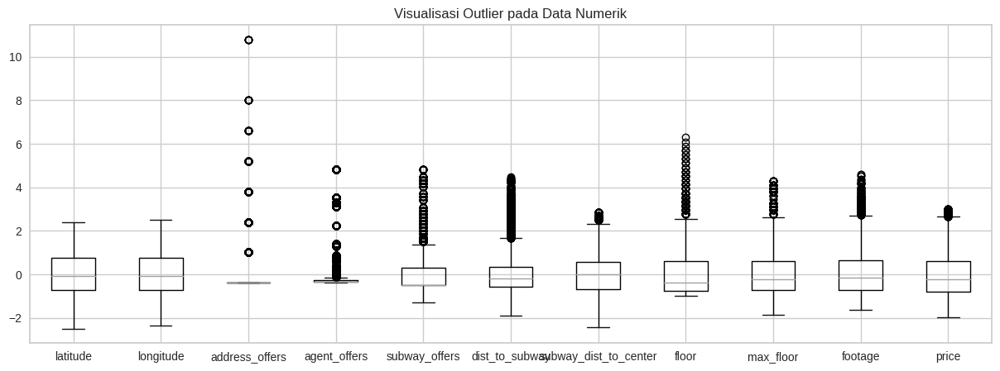

In [ ]:
# Import libraries
from sklearn.preprocessing import StandardScaler

# Drop data kategorikal
df_viz_outlier = df_cleaned.drop(categorical, axis=1)

# Scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_viz_outlier)

# Visualisasi Outlier
viz_outlier = pd.DataFrame(scaled_data)
viz_outlier.columns = df_viz_outlier.columns.values.tolist()
viz_outlier.boxplot(figsize=(15,5))
plt.title("Visualisasi Outlier pada Data Numerik")

In [ ]:
from tabulate import tabulate

In [ ]:
# Membuat fungsi count outliers
def count_outliers(data):
    results = []

    for dataname in data:
        sorted_data = data.sort_values(by=[dataname])

        q1 = sorted_data[dataname].quantile(0.25)
        q3 = sorted_data[dataname].quantile(0.75)

        iqr = q3 - q1
        lower = q1 - (iqr * 1.5)
        upper = q3 + (iqr * 1.5)
        above_upper = len(data.loc[data[dataname] > upper])
        below_lower = len(data.loc[data[dataname] < lower])
        outliers = above_upper + below_lower
        total = data[dataname].notnull().sum()
        p = outliers / total * 100

        result_dict = {
            "Column": dataname,
            "Total Outliers": outliers,
            "%": round(p, 2),
            "Lower Bound": round(lower, 2),
            "Upper Bound": round(upper, 2),
            "Data Below LB": below_lower,
            "Data Above UB": above_upper,
            "Min Value": data[dataname].min(),
            "Max Value": data[dataname].max(),
        }
        results.append(result_dict)

    # Convert results to a DataFrame for tabulation
    results_df = pd.DataFrame(results)

    # Right-align numeric columns
    num_cols = results_df.select_dtypes(include=['number']).columns
    colalign = ['right' if col in num_cols else 'left' for col in results_df.columns]

    # Display the tabulated results with right-aligned numeric columns
    print(tabulate(results_df, headers='keys', tablefmt='pretty', showindex=False, colalign=colalign))

In [ ]:
count_outliers(df_viz_outlier)

+-----------------------+----------------+-------+-------------+-------------+---------------+---------------+------------+-------------------+
| Column                | Total Outliers |     % | Lower Bound | Upper Bound | Data Below LB | Data Above UB |  Min Value |         Max Value |
+-----------------------+----------------+-------+-------------+-------------+---------------+---------------+------------+-------------------+
| latitude              |              0 |   0.0 |       55.49 |       55.99 |             0 |             0 | 55.5276313 | 55.94157740000001 |
| longitude             |              0 |   0.0 |       37.23 |       38.01 |             0 |             0 |  37.306055 |         37.950668 |
| address_offers        |           1926 |  18.6 |         1.0 |         1.0 |             0 |          1926 |        1.0 |               9.0 |
| agent_offers          |           1824 | 17.62 |        -6.5 |        13.5 |             0 |          1824 |        0.0 |             

> Terlihat bahwa terdapat outlier pada seluruh atribut numerikal kecuali `latitude` dan `longitude`.

Kami akan melakukan outliers handling dengan metode capping

In [ ]:
columns_to_cap = df_viz_outlier.columns.tolist()

df_viz_outlier_new = pd.DataFrame()

for column in columns_to_cap:
    q1 = df_viz_outlier[column].quantile(0.25)
    q3 = df_viz_outlier[column].quantile(0.75)

    # Calculate IQR
    IQR = q3 - q1

    # Define max and min limits
    max_limit = q3 + (1.5 * IQR)
    min_limit = q1 - (1.5 * IQR)

    # Perform capping on the current column
    df_viz_outlier_new[column] = pd.DataFrame(np.where(df_viz_outlier[column] > max_limit, max_limit,
                                                np.where(df_viz_outlier[column] < min_limit, min_limit, df_viz_outlier[column])),
                                       columns=[column])

In [ ]:
df_viz_outlier_new.head()

,latitude,longitude,address_offers,agent_offers,subway_offers,dist_to_subway,subway_dist_to_center,floor,max_floor,footage,price
0,55.702410,37.940178,1.0,1.0,18.0,763.0,20323.0,9.0,12.0,40.0,8200000.0
1,55.709341,37.764728,1.0,1.0,15.0,437.0,10612.0,9.0,17.0,66.0,14000000.0
2,55.820905,37.579699,1.0,1.0,12.0,319.0,7829.0,3.0,9.0,32.5,9100000.0
3,55.691564,37.806339,1.0,1.0,11.0,1684.0,13469.0,6.0,14.0,37.9,7600000.0
4,55.675570,37.682594,1.0,1.0,12.0,1201.0,8849.0,12.0,12.0,42.0,10300000.0


In [ ]:
count_outliers(df_viz_outlier_new)

+-----------------------+----------------+-----+-------------+-------------+---------------+---------------+------------+-------------------+
| Column                | Total Outliers |   % | Lower Bound | Upper Bound | Data Below LB | Data Above UB |  Min Value |         Max Value |
+-----------------------+----------------+-----+-------------+-------------+---------------+---------------+------------+-------------------+
| latitude              |              0 | 0.0 |       55.49 |       55.99 |             0 |             0 | 55.5276313 | 55.94157740000001 |
| longitude             |              0 | 0.0 |       37.23 |       38.01 |             0 |             0 |  37.306055 |         37.950668 |
| address_offers        |              0 | 0.0 |         1.0 |         1.0 |             0 |             0 |        1.0 |               1.0 |
| agent_offers          |              0 | 0.0 |        -6.5 |        13.5 |             0 |             0 |        0.0 |              13.5 |
| subw

In [ ]:
# Mengupdate data dengan data yang tanpa outlier
df_cleaned_all = df_cleaned.copy()
df_cleaned_all.update(df_viz_outlier_new)

In [ ]:
df_cleaned_all

,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price,category_age
0,55.702410,37.940178,UVAO,1.0,1.0,18.0,Dmitrievskaya,763.0,Underground,20323.0,One Room,9.0,12.0,40.0,panel,Good,8200000.0,Young buildings
1,55.709341,37.764728,UVAO,1.0,1.0,15.0,Kiyevskaya,437.0,Underground,10612.0,Two Room,9.0,17.0,66.0,monolith,Excellent,14000000.0,Middle-aged buildings
2,55.820905,37.579699,SVAO,1.0,1.0,12.0,Vystavochny Tsentr,319.0,Underground,7829.0,One Room,3.0,9.0,32.5,block,Excellent,9100000.0,Old buildings
3,55.691564,37.806339,UVAO,1.0,1.0,11.0,Kashirskaya,1684.0,Underground,13469.0,Two Room,6.0,14.0,37.9,block,Poor,7600000.0,Old buildings
4,55.675570,37.682594,UAO,1.0,1.0,12.0,Izmaylovskaya,1201.0,Underground,8849.0,Two Room,12.0,12.0,42.0,block,Enough,10300000.0,Old buildings
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10348,55.638211,37.363726,ZAO,1.0,1.0,7.0,Polyanka,586.0,Underground,20688.0,Two Room,11.0,12.0,51.5,panel,Enough,10500000.0,Middle-aged buildings
10349,55.633076,37.610935,UAO,1.0,1.0,6.0,ZIL,815.0,Underground,12436.0,Two Room,10.0,18.0,58.6,panel,Enough,14300000.0,Middle-aged buildings
10350,55.723364,37.607906,CAO,1.0,11.0,4.0,Verkhnie Kotly,504.0,Underground,3744.0,Two Room,8.0,9.0,38.0,panel,Enough,11500000.0,Old buildings
10351,55.675417,37.753964,UVAO,1.0,2.0,16.0,Ulitsa Starokachalovskaya,815.0,Underground,9000.0,One Room,16.0,23.0,42.0,monolith,Good,11000000.0,Middle-aged buildings


In [ ]:
df_cleaned_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10353 entries, 0 to 10352
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   latitude               10353 non-null  float64
 1   longitude              10353 non-null  float64
 2   district               10353 non-null  object 
 3   address_offers         10353 non-null  float64
 4   agent_offers           10353 non-null  float64
 5   subway_offers          10353 non-null  float64
 6   closest_subway         10353 non-null  object 
 7   dist_to_subway         10353 non-null  float64
 8   subway_grade           10353 non-null  object 
 9   subway_dist_to_center  10353 non-null  float64
 10  rooms                  10353 non-null  object 
 11  floor                  10353 non-null  float64
 12  max_floor              10353 non-null  float64
 13  footage                10353 non-null  float64
 14  material               10353 non-null  object 
 15  re

#### Encoding

In [ ]:
df_clean = df_cleaned_all.copy()

In [ ]:
df_cleaned_all.head(5)

,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_grade,subway_dist_to_center,rooms,floor,max_floor,footage,material,repair,price,category_age
0,55.702410,37.940178,UVAO,1.0,1.0,18.0,Dmitrievskaya,763.0,Underground,20323.0,One Room,9.0,12.0,40.0,panel,Good,8200000.0,Young buildings
1,55.709341,37.764728,UVAO,1.0,1.0,15.0,Kiyevskaya,437.0,Underground,10612.0,Two Room,9.0,17.0,66.0,monolith,Excellent,14000000.0,Middle-aged buildings
2,55.820905,37.579699,SVAO,1.0,1.0,12.0,Vystavochny Tsentr,319.0,Underground,7829.0,One Room,3.0,9.0,32.5,block,Excellent,9100000.0,Old buildings
3,55.691564,37.806339,UVAO,1.0,1.0,11.0,Kashirskaya,1684.0,Underground,13469.0,Two Room,6.0,14.0,37.9,block,Poor,7600000.0,Old buildings
4,55.675570,37.682594,UAO,1.0,1.0,12.0,Izmaylovskaya,1201.0,Underground,8849.0,Two Room,12.0,12.0,42.0,block,Enough,10300000.0,Old buildings


In [ ]:
df_cleaned_all.describe(include='object')

,district,closest_subway,subway_grade,rooms,material,repair,category_age
count,10353,10353,10353,10353,10353,10353,10353
unique,9,177,4,2,4,4,3
top,UVAO,Dmitrievskaya,Underground,Two Room,panel,Enough,Old buildings
freq,2722,1295,8983,6750,4901,6126,5547


In [ ]:
for column in df_cleaned_all.select_dtypes(include='object').columns:
    unique_values = df_cleaned_all[column].unique()
    print(f"Unique values for column '{column}':")
    print(unique_values)
    print()

Unique values for column 'district':
['UVAO' 'SVAO' 'UAO' 'ZAO' 'UZAO' 'VAO' 'SAO' 'SZAO' 'CAO']

Unique values for column 'closest_subway':
['Dmitrievskaya' 'Kiyevskaya' 'Vystavochny Tsentr' 'Kashirskaya'
 'Izmaylovskaya' 'Polyanka' 'Universitet' 'Kommunarka' 'Otradnoye'
 'Perovo' 'Kaluzhskaya' 'Tsaritsyno' 'Novokuznetskaya' 'Belomorskaya'
 'Kuntsevskaya' 'Biblioteka Imeni Lenina' 'Slavyansky Bulvar' 'Altufyevo'
 'Prospekt Mira' 'Buninskaya Alleya' 'Dinamo' 'Chekhovskaya'
 'Aviamotornaya' 'Ulitsa Starokachalovskaya' 'Andronovka' 'Krasnoselskaya'
 'Rechnoy Vokzal' 'Studencheskaya' 'Khovrino' 'Pyatnitskoye Shosse'
 'Komsomolskaya' 'Prazhskaya' 'Krasnogvardeyskaya' 'Bulvar Rokossovskogo'
 'Trubnaya' 'Aleksandrovsky Sad' 'Sportivnaya' 'Cherkizovskaya'
 'Timiryazevskaya' 'Mayakovskaya' 'Rostokino' 'Ugreshskaya'
 'Savyolovskaya' 'Rimskaya' 'Bittsevsky Park' 'Petrovsko-Razumovskaya'
 'Verkhniye Likhobory' 'Orekhovo' 'Sretensky Bulvar' 'Davydkovo'
 'Rumyantsevo' 'Bibirevo' 'Mnyovniki' 'Maryin

* `district`, `rooms`, `closest_subway` akan digunakan label encoding
* `subway_grade,	material` akan digunakan one hot encoding
* `repair,	category_age` akan digunakan ordinal encoding

In [ ]:
# Encoding Atribut Kategorikal
from sklearn import preprocessing

# Label Encoder
le = preprocessing.LabelEncoder()
df_cleaned_all['district'] = le.fit_transform(df_cleaned_all['district'])
df_cleaned_all['closest_subway'] = le.fit_transform(df_cleaned_all['closest_subway'])
df_cleaned_all['rooms'] = le.fit_transform(df_cleaned_all['rooms'])

# One Hot Encoder
ohe = preprocessing.OneHotEncoder()
columns_to_encode = ['subway_grade', 'material']
df_cleaned_all = pd.get_dummies(df_cleaned_all, columns=columns_to_encode)

# Ordinal Encoder
repair_order = {'Poor': 0, 'Enough': 1, 'Good': 2, 'Excellent': 3}
df_cleaned_all['repair'] = df_cleaned_all['repair'].map(repair_order)

category_age_order = {'Young buildings': 0, 'Middle-aged buildings': 1, 'Old buildings': 2}
df_cleaned_all['category_age'] = df_cleaned_all['category_age'].map(category_age_order)

df_cleaned_all

,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_dist_to_center,rooms,...,price,category_age,subway_grade_Monorail,subway_grade_Suburban rail,subway_grade_Underground,subway_grade_Urban rail,material_block,material_brick,material_monolith,material_panel
0,55.702410,37.940178,5,1.0,1.0,18.0,35,763.0,20323.0,0,...,8200000.0,0,0,0,1,0,0,0,0,1
1,55.709341,37.764728,5,1.0,1.0,15.0,54,437.0,10612.0,1,...,14000000.0,1,0,0,1,0,0,0,1,0
2,55.820905,37.579699,2,1.0,1.0,12.0,172,319.0,7829.0,0,...,9100000.0,2,0,0,1,0,1,0,0,0
3,55.691564,37.806339,5,1.0,1.0,11.0,51,1684.0,13469.0,1,...,7600000.0,2,0,0,1,0,1,0,0,0
4,55.675570,37.682594,4,1.0,1.0,12.0,47,1201.0,8849.0,1,...,10300000.0,2,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10348,55.638211,37.363726,8,1.0,1.0,7.0,110,586.0,20688.0,1,...,10500000.0,1,0,0,1,0,0,0,0,1
10349,55.633076,37.610935,4,1.0,1.0,6.0,175,815.0,12436.0,1,...,14300000.0,1,0,0,1,0,0,0,0,1
10350,55.723364,37.607906,0,1.0,11.0,4.0,163,504.0,3744.0,1,...,11500000.0,2,0,0,1,0,0,0,0,1
10351,55.675417,37.753964,5,1.0,2.0,16.0,160,815.0,9000.0,0,...,11000000.0,1,0,0,1,0,0,0,1,0


In [ ]:
df_cleaned_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10353 entries, 0 to 10352
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   latitude                    10353 non-null  float64
 1   longitude                   10353 non-null  float64
 2   district                    10353 non-null  int64  
 3   address_offers              10353 non-null  float64
 4   agent_offers                10353 non-null  float64
 5   subway_offers               10353 non-null  float64
 6   closest_subway              10353 non-null  int64  
 7   dist_to_subway              10353 non-null  float64
 8   subway_dist_to_center       10353 non-null  float64
 9   rooms                       10353 non-null  int64  
 10  floor                       10353 non-null  float64
 11  max_floor                   10353 non-null  float64
 12  footage                     10353 non-null  float64
 13  repair                      103

#### Standarisasi

In [ ]:
df_cleaned_all_std = df_cleaned_all.copy()

In [ ]:
df_cleaned_all_std.columns

Index(['latitude', 'longitude', 'district', 'address_offers', 'agent_offers',
       'subway_offers', 'closest_subway', 'dist_to_subway',
       'subway_dist_to_center', 'rooms', 'floor', 'max_floor', 'footage',
       'repair', 'price', 'category_age', 'subway_grade_Monorail',
       'subway_grade_Suburban rail', 'subway_grade_Underground',
       'subway_grade_Urban rail', 'material_block', 'material_brick',
       'material_monolith', 'material_panel'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

cols_to_scale = ['latitude', 'longitude', 'closest_subway', 'dist_to_subway',
                 'subway_dist_to_center', 'footage', 'price']

scaler = MinMaxScaler()
df_cleaned_all_std[cols_to_scale] = scaler.fit_transform(df_cleaned_all_std[cols_to_scale])

In [ ]:
df_cleaned_all_std

,latitude,longitude,district,address_offers,agent_offers,subway_offers,closest_subway,dist_to_subway,subway_dist_to_center,rooms,...,price,category_age,subway_grade_Monorail,subway_grade_Suburban rail,subway_grade_Underground,subway_grade_Urban rail,material_block,material_brick,material_monolith,material_panel
0,0.422226,0.983727,5,1.0,1.0,18.0,0.198864,0.449492,0.882969,0,...,0.234043,0,0,0,1,0,0,0,0,1
1,0.438968,0.711548,5,1.0,1.0,15.0,0.306818,0.254632,0.436147,1,...,0.645390,1,0,0,1,0,0,0,1,0
2,0.708483,0.424509,2,1.0,1.0,12.0,0.977273,0.184100,0.308096,0,...,0.297872,2,0,0,1,0,1,0,0,0
3,0.396025,0.776100,5,1.0,1.0,11.0,0.289773,1.000000,0.567603,1,...,0.191489,2,0,0,1,0,1,0,0,0
4,0.357386,0.584132,4,1.0,1.0,12.0,0.267045,0.711297,0.355028,1,...,0.382979,2,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10348,0.267136,0.089466,8,1.0,1.0,7.0,0.625000,0.343694,0.899763,1,...,0.397163,1,0,0,1,0,0,0,0,1
10349,0.254731,0.472966,4,1.0,1.0,6.0,0.994318,0.480574,0.520073,1,...,0.666667,1,0,0,1,0,0,0,0,1
10350,0.472846,0.468267,0,1.0,11.0,4.0,0.926136,0.294680,0.120137,1,...,0.468085,2,0,0,1,0,0,0,0,1
10351,0.357017,0.694849,5,1.0,2.0,16.0,0.909091,0.480574,0.361976,0,...,0.432624,1,0,0,1,0,0,0,1,0


In [ ]:
df1 = df_cleaned_all_std.copy()
df2 = df_cleaned_all_std.copy()
df3 = df_cleaned_all_std.copy()
df4 = df_cleaned_all_std.copy()

### PCA

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
cluster_sc = scaler.fit_transform(df1)

In [ ]:
pca = PCA(n_components=2)

In [ ]:
pca.fit(cluster_sc)
pca_data = pca.transform(cluster_sc)

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

print("Original shape: {}".format(str(df1.shape)))

principal_components = pca.fit_transform(df1)

print("Transformed shape: {}".format(str(principal_components.shape)))
print("Explained variance ratio: {}".format(pca.explained_variance_ratio_))

Original shape: (10353, 24)
Transformed shape: (10353, 2)
Explained variance ratio: [0.37100503 0.22364692]


In [ ]:
principal_components_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
principal_components_df.head()

,PC1,PC2
0,1.910137,-2.783472
1,5.634395,-2.940464
2,-4.776756,-2.827681
3,0.929581,-2.998745
4,2.683132,-2.995236


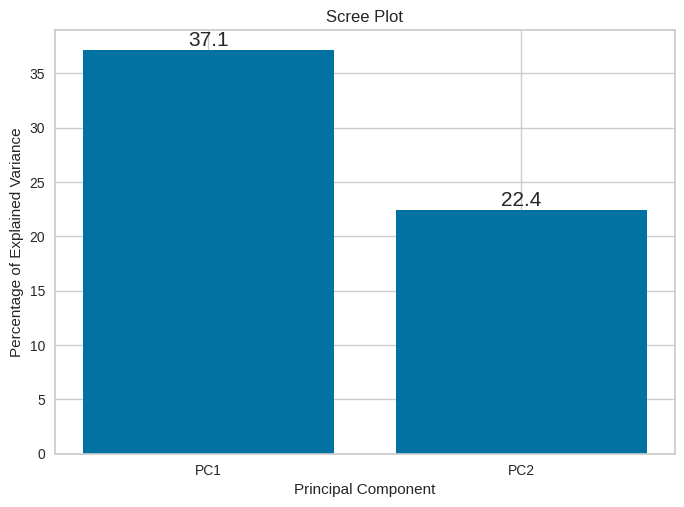

In [ ]:
per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]

ax = plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.bar_label(ax, label_type='edge')
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

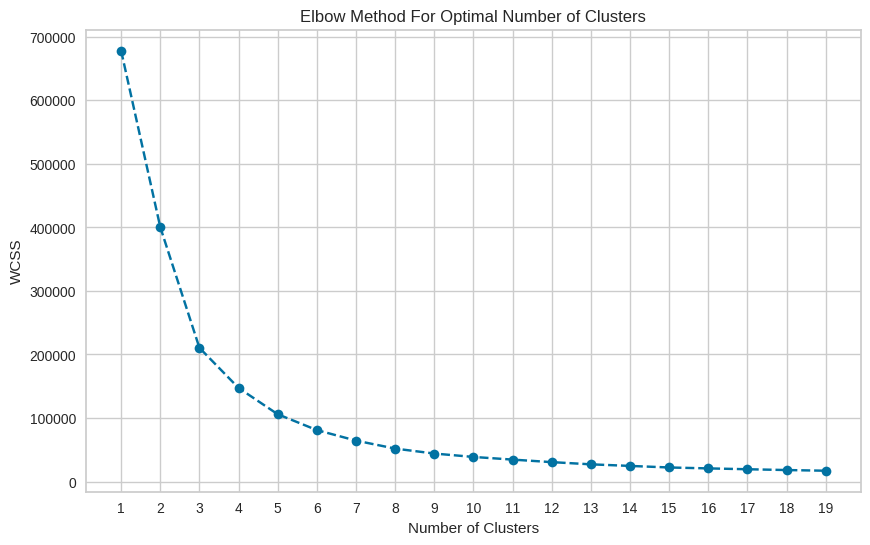

In [ ]:
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=1)
    kmeans.fit(principal_components_df)
    wcss.append(kmeans.inertia_)

# Plotting the Elbow Method Graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, 20), wcss, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.xticks(range(1, 20))
plt.grid(True)
plt.show()

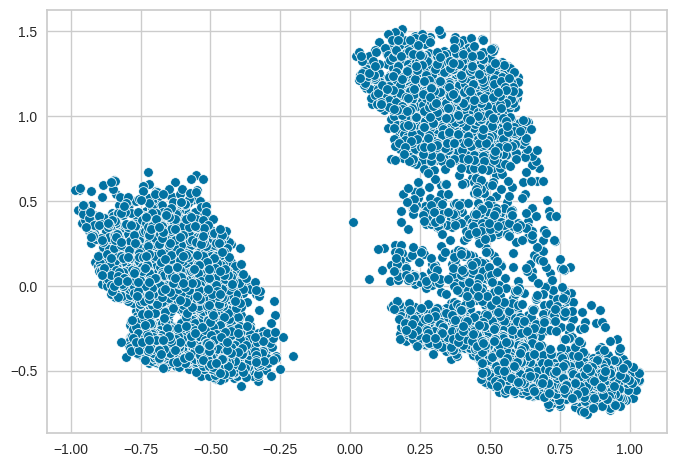

In [ ]:
sns.scatterplot(x=pca_data[:,0], y=pca_data[:,1],data=pca_data)
plt.show()

In [ ]:
# surpress future warning
import warnings
warnings.filterwarnings("ignore")

For n_clusters = 2 The average silhouette_coefficient is : 0.17335887134707534
For n_clusters = 3 The average silhouette_coefficient is : 0.2263051146900699
For n_clusters = 4 The average silhouette_coefficient is : 0.2615597293947652
For n_clusters = 5 The average silhouette_coefficient is : 0.22576550844894597
For n_clusters = 6 The average silhouette_coefficient is : 0.2261017554281311
For n_clusters = 7 The average silhouette_coefficient is : 0.22259813199516187
For n_clusters = 8 The average silhouette_coefficient is : 0.2267422695149956
For n_clusters = 9 The average silhouette_coefficient is : 0.1858152555701853
For n_clusters = 10 The average silhouette_coefficient is : 0.1847180428920953
For n_clusters = 11 The average silhouette_coefficient is : 0.18191350209192467


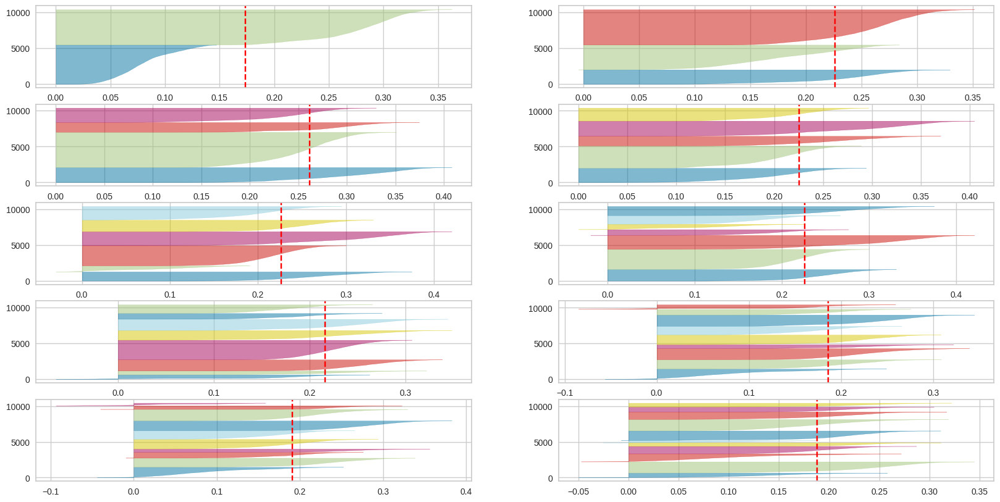

In [ ]:
num_of_cluster = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

fig, ax = plt.subplots(5, 2, figsize=(20,10))
for k in num_of_cluster:
    # Create KMeans instance for different number of clusters
    clusterer = KMeans(n_clusters = k, n_init=10)

    # Draw silhouette diagram
    q, mod = divmod(k, 2)
    visualizer = SilhouetteVisualizer(clusterer, colors = 'yellowbrick', ax = ax[q-1][mod])
    visualizer.fit(cluster_sc)

    # Compute silhoutte score
    # This gives a perspective into the density and separation of the formed clusters
    cluster_labels = clusterer.fit_predict(cluster_sc)
    silhouette_avg = silhouette_score(cluster_sc, cluster_labels)
    print(
        "For n_clusters =",
        k,
        "The average silhouette_coefficient is :",
        silhouette_avg,
    )

In [ ]:
km = KMeans(n_clusters=4, random_state=0)
df_km = km.fit_predict(pca_data)
centroids = km.cluster_centers_

In [ ]:
plt.figure(figsize=(8,5))
sns.scatterplot(data=pca_data, hue=df_km, x=pca_data[:,0], y=pca_data[:,1], palette='tab10')
plt.scatter(centroids[:,0], centroids[:,1], marker="*", color="black")
plt.show()

In [ ]:
clustered = df_clean.copy(deep=True)

In [ ]:
clustered.insert(0,'cluster',df_km)

In [ ]:
display(clustered)

In [ ]:
ax = sns.countplot(x=clustered['cluster'])
plt.bar_label(ax.containers[0])
plt.show()

In [ ]:
ax = sns.barplot(x=clustered['cluster'], y=clustered['subway_grade'], errorbar=('ci', False))
plt.bar_label(ax.containers[0])
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

age_distribution = clustered.groupby(['cluster', 'category_age']).size().reset_index(name='count')

# Pivot the data for better visualization
age_distribution_pivot = age_distribution.pivot(index='cluster', columns='category_age', values='count').fillna(0)

# Plot the stacked bar chart with horizontal bars
age_distribution_pivot.plot(kind='barh', stacked=True, colormap='viridis')
plt.xlabel('Number of Properties')
plt.ylabel('Cluster')
plt.title('Age Distribution of Buildings in Each Cluster')
plt.legend(title='Category Age', loc='upper right', bbox_to_anchor=(1.2, 1))

plt.show()

In [ ]:
ax = sns.countplot(x=clustered['cluster'], hue=clustered['subway_grade'])
plt.bar_label(ax.containers[0])
plt.bar_label(ax.containers[1])
plt.bar_label(ax.containers[2])
plt.bar_label(ax.containers[3])
plt.show()

In [ ]:
ax = sns.countplot(x=clustered['cluster'], hue=clustered['rooms'])
plt.bar_label(ax.containers[0])
plt.bar_label(ax.containers[1])
plt.show()

In [ ]:
ax = sns.barplot(x=clustered['cluster'], y=clustered['price'], errorbar=('ci', False))
plt.bar_label(ax.containers[0])
plt.show()

# References

 *Skew() function in pandas*. skew() function in pandas | Pythontic.com. (n.d.). https://pythontic.com/pandas/dataframe-computations/skew#:~:text=When%20a%20distribution%20is%20asymmetrical,hand%20side%20of%20the%20curve

